In [4]:
import numpy as np
import matplotlib.pyplot as plt
from astropy import units as u
from dynesty import NestedSampler
from dynesty import utils as dyfunc
from dynesty import plotting as dyplot
from numpy import linalg
import pandas as pd
import statistics
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.cm as cm
import matplotlib as mpl

In [5]:
# read in the data

df = pd.read_csv('vbandgalacticmag.txt', delim_whitespace=True)

# print_full(df['latitude'])

print(df)

     longitude  latitude  Avtot   N3   N4   N5   N6   N7   N8   N9  ...   N11  \
0        180.0     -90.0    0.0  0.0  0.0  0.0  0.0  0.0  0.0  2.0  ...  14.0   
1          0.0     -80.0    0.0  0.0  0.0  0.0  0.0  0.0  3.0  3.0  ...  11.0   
2          5.0     -80.0    0.0  0.0  0.0  0.0  0.0  0.0  2.0  3.0  ...  10.0   
3         10.0     -80.0    0.0  0.0  0.0  0.0  0.0  0.0  1.0  3.0  ...  14.0   
4         15.0     -80.0    0.0  0.0  0.0  0.0  0.0  0.0  2.0  3.0  ...  13.0   
..         ...       ...    ...  ...  ...  ...  ...  ...  ...  ...  ...   ...   
854      340.0      80.0    0.0  0.0  0.0  0.0  0.0  0.0  2.0  3.0  ...  10.0   
855      345.0      80.0    0.0  0.0  1.0  0.0  0.0  0.0  0.0  2.0  ...  10.0   
856      350.0      80.0    0.0  0.0  0.0  0.0  0.0  0.0  1.0  2.0  ...   6.0   
857      355.0      80.0    0.0  0.0  0.0  0.0  1.0  0.0  0.0  2.0  ...   8.0   
858      180.0      90.0    0.0  0.0  0.0  1.0  1.0  0.0  0.0  3.0  ...  11.0   

      N12   N13   N14    N1

In [12]:
# define sigma function

def sigma_v(theta, V_magnitudes):
    sigma_0, alpha_1, alpha_2, V_b, s = theta
    value = sigma_0 * (1/(10**(-s*alpha_1*(V_magnitudes-V_b)) + 10**(-s*alpha_2*(V_magnitudes-V_b)))) ** (1/s)
    return value

# make summary plots for each latitude
# plot sigma_0 on log axis
# set alpha_1 = 0.4 and make all the summary plots for each latitude

In [13]:
def loglike(x):
    sigma_0 = x[0]
    alpha_1 = x[1]
    alpha_2 = x[2]
    V_b = x[3]
    s = x[4]
    theta = sigma_0, alpha_1, alpha_2, V_b, s
    model = sigma_v(theta, magnitudes)
    diff = data - model
    lp = -0.5 * np.dot(diff, np.dot(Cinv, diff)) + lnorm
    return lp

def prior_transform(u):
    x = np.array(u)
    x[0] = 5e6 + 5e6*(2*u[0]-1) # sigma_0
    x[1] = 0.5 + 0.5*(2*u[1]-1) # alpha_1
    x[2] = ((x[1]+0)/2) + ((x[1]-0)/2)*(2*u[2]-1) # alpha_2
    x[3] = 15 + 5*(2*u[3]-1) # V_b
    x[4] = 5 + 5*(2*u[4]-1) # s
    return x

457it [00:00, 4567.08it/s, bound: 0 | nc: 1 | ncall: 1239 | eff(%): 36.885 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/-    nan | dlogz:    inf >  0.509]

0.0 longitude
-1.0 latitude
N3           0.0
N4           0.0
N5           1.0
N6           0.0
N7           2.0
N8          15.0
N9          37.0
N10        168.0
N11        498.0
N12       1906.0
N13       7942.0
N14      40101.0
N15     150361.0
N16     473023.0
N17     540610.0
N18    2101279.0
N19    7426419.0
N20    9801354.0
Name: 397, dtype: float64
N3        0.000000
N4        0.000000
N5        1.000000
N6        0.000000
N7        1.414214
N8        3.872983
N9        6.082763
N10      12.961481
N11      22.315914
N12      43.657760
N13      89.117899
N14     200.252341
N15     387.764104
N16     687.766676
N17     735.261858
N18    1449.578904
N19    2725.145684
N20    3130.711421
Name: 397, dtype: float64


21151it [00:32, 644.20it/s, +500 | bound: 259 | nc: 1 | ncall: 502306 | eff(%):  4.315 | loglstar:   -inf < -128506.207 <    inf | logz: -128547.852 +/-    nan | dlogz:  0.001 >  0.509]


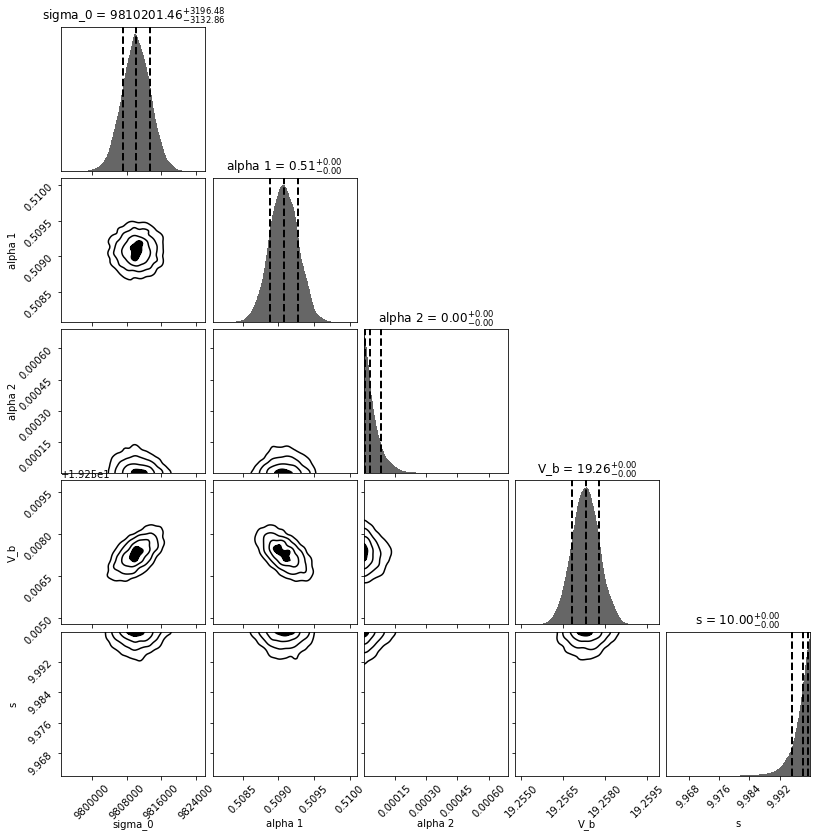

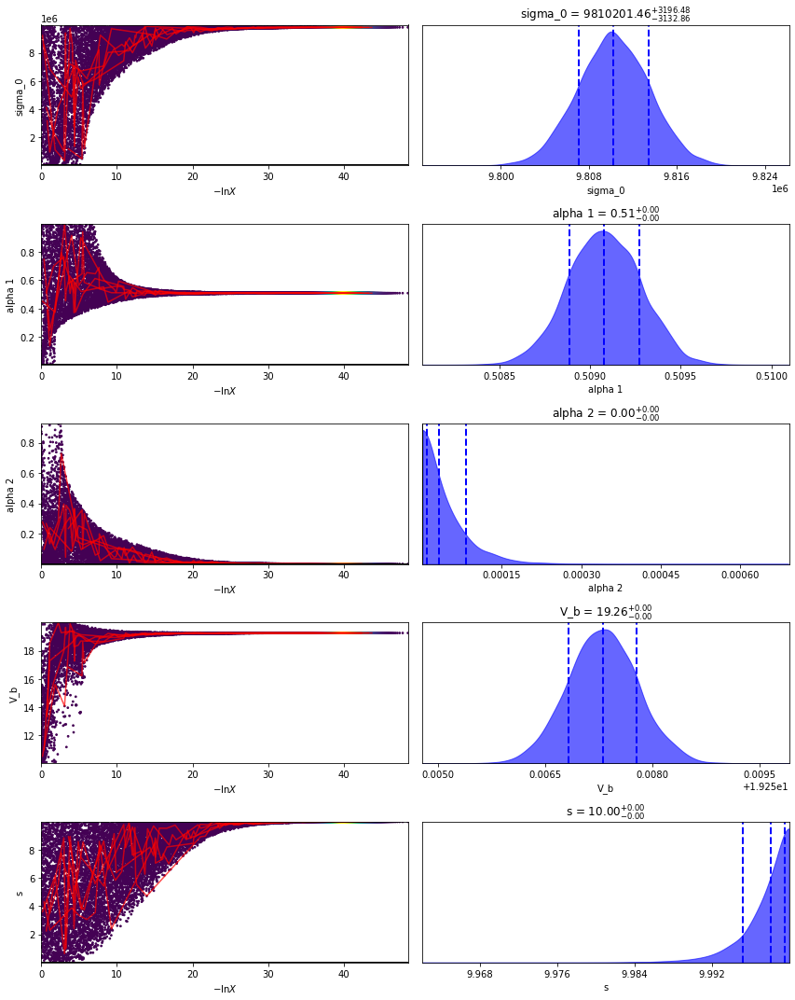

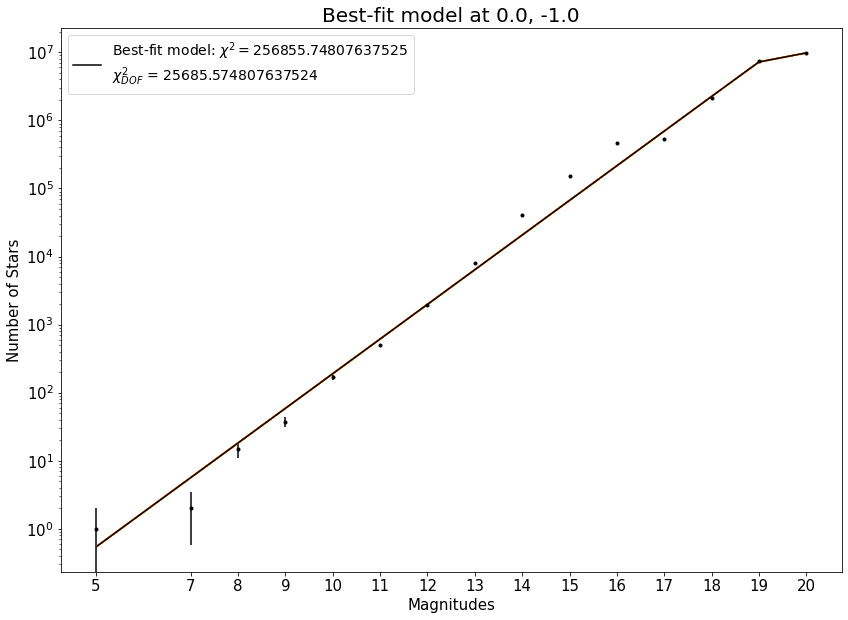

533it [00:00, 5329.74it/s, bound: 0 | nc: 6 | ncall: 1413 | eff(%): 37.721 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/-    nan | dlogz:    inf >  0.509]

5.0 longitude
-1.0 latitude
N3         0.0
N4         0.0
N5         0.0
N6         1.0
N7         1.0
N8         7.0
N9        25.0
N10       83.0
N11      212.0
N12      499.0
N13     1069.0
N14     2209.0
N15     4733.0
N16     8952.0
N17    15656.0
N18    26352.0
N19    44503.0
N20    73974.0
Name: 398, dtype: float64
N3       0.000000
N4       0.000000
N5       0.000000
N6       1.000000
N7       1.000000
N8       2.645751
N9       5.000000
N10      9.110434
N11     14.560220
N12     22.338308
N13     32.695565
N14     47.000000
N15     68.796802
N16     94.615009
N17    125.123939
N18    162.332991
N19    210.957342
N20    271.981617
Name: 398, dtype: float64


15881it [00:26, 605.68it/s, +500 | bound: 203 | nc: 1 | ncall: 371352 | eff(%):  4.417 | loglstar:   -inf < -77.643 <    inf | logz: -108.832 +/-    nan | dlogz:  0.001 >  0.509] 


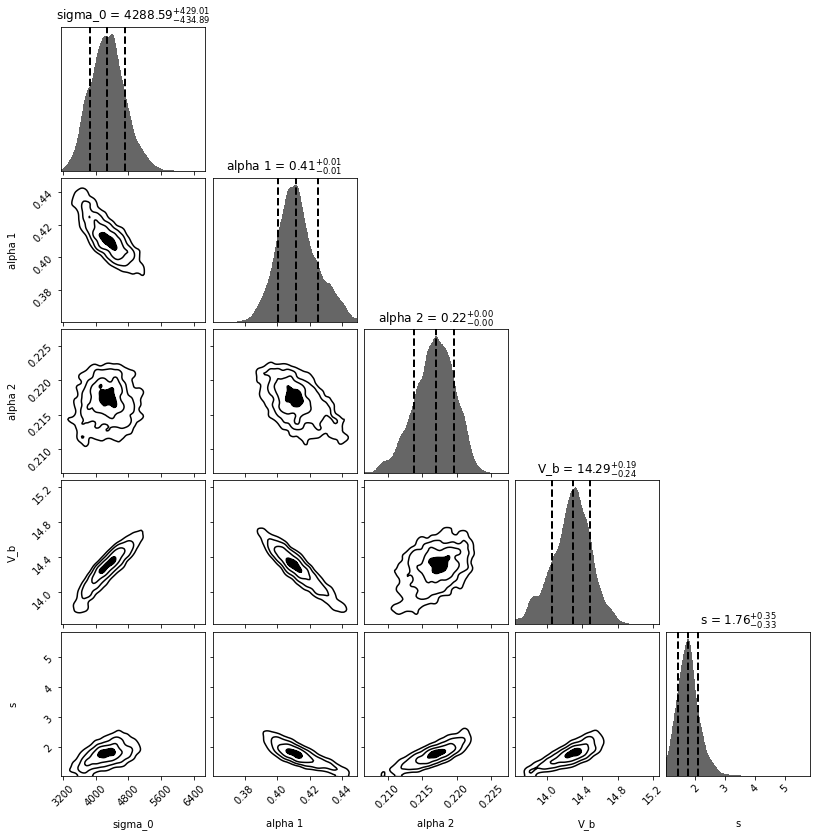

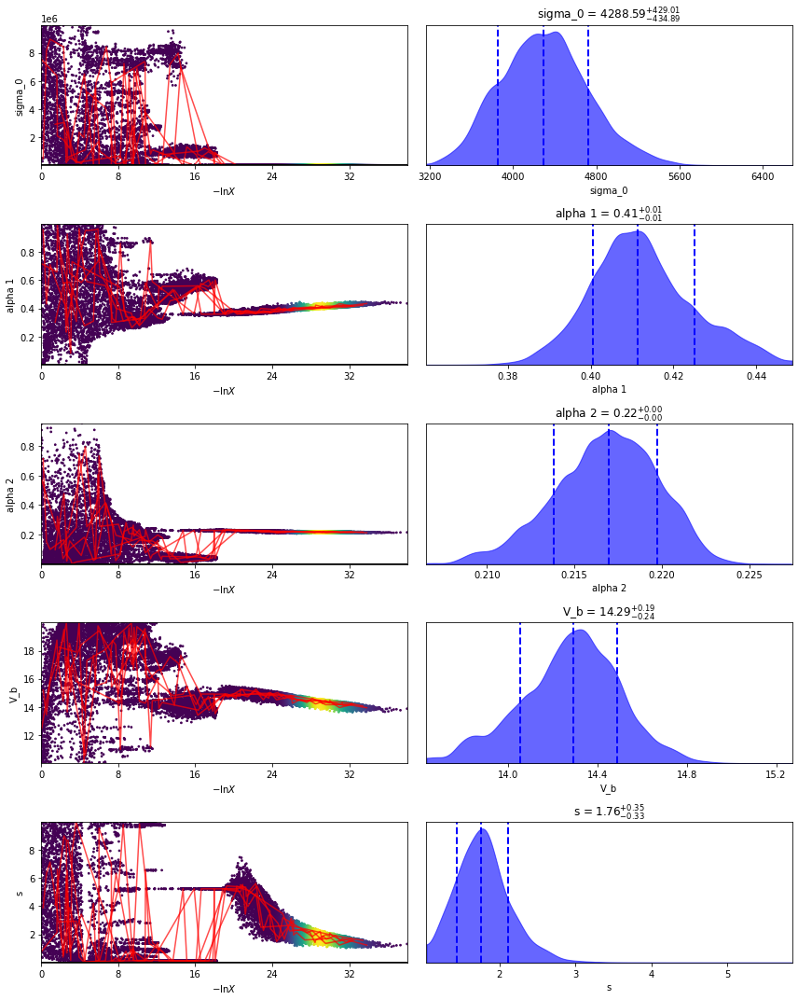

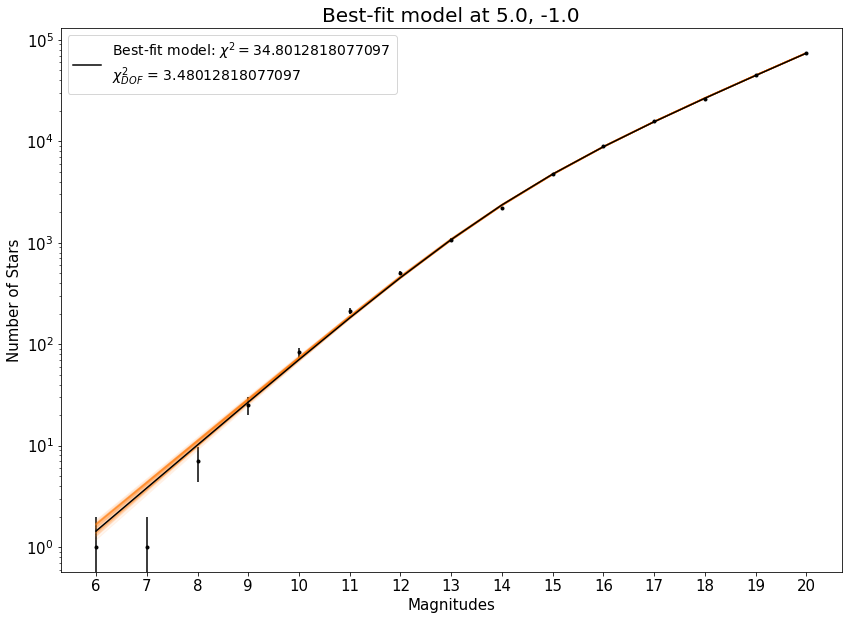

468it [00:00, 4678.54it/s, bound: 0 | nc: 2 | ncall: 1250 | eff(%): 37.440 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/-    nan | dlogz:    inf >  0.509]

10.0 longitude
-1.0 latitude
N3         0.0
N4         0.0
N5         1.0
N6         0.0
N7         1.0
N8         5.0
N9        26.0
N10       79.0
N11      192.0
N12      503.0
N13      949.0
N14     2119.0
N15     4391.0
N16     8353.0
N17    15427.0
N18    25908.0
N19    42277.0
N20    66059.0
Name: 399, dtype: float64
N3       0.000000
N4       0.000000
N5       1.000000
N6       0.000000
N7       1.000000
N8       2.236068
N9       5.099020
N10      8.888194
N11     13.856406
N12     22.427661
N13     30.805844
N14     46.032597
N15     66.264621
N16     91.394748
N17    124.205475
N18    160.959622
N19    205.613715
N20    257.019455
Name: 399, dtype: float64


14546it [00:23, 608.55it/s, +500 | bound: 181 | nc: 1 | ncall: 336237 | eff(%):  4.481 | loglstar:   -inf < -78.828 <    inf | logz: -107.327 +/-    nan | dlogz:  0.001 >  0.509] 


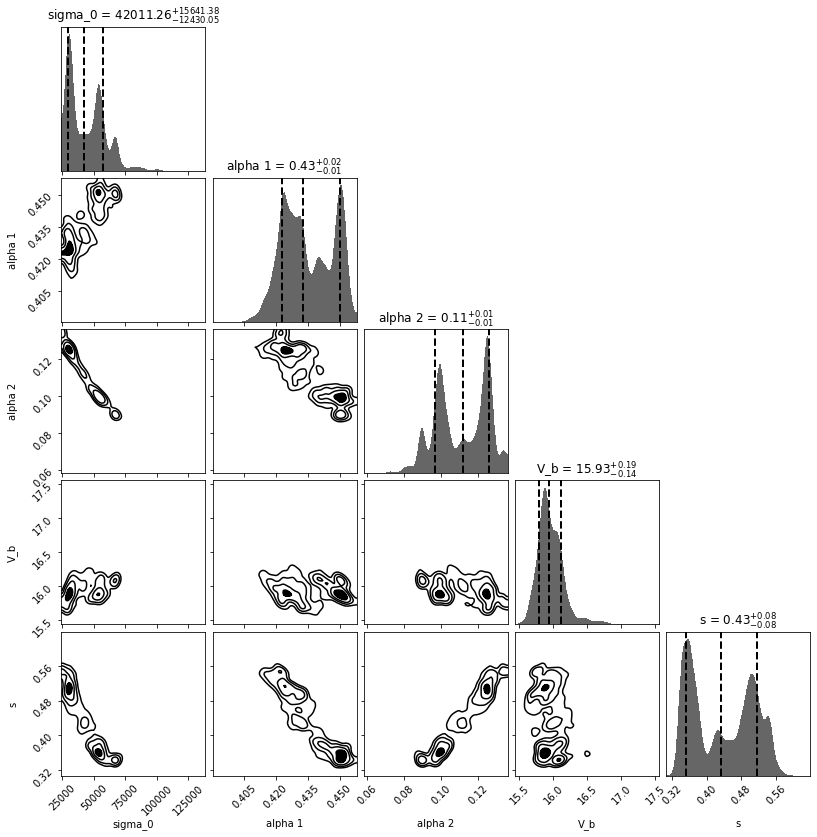

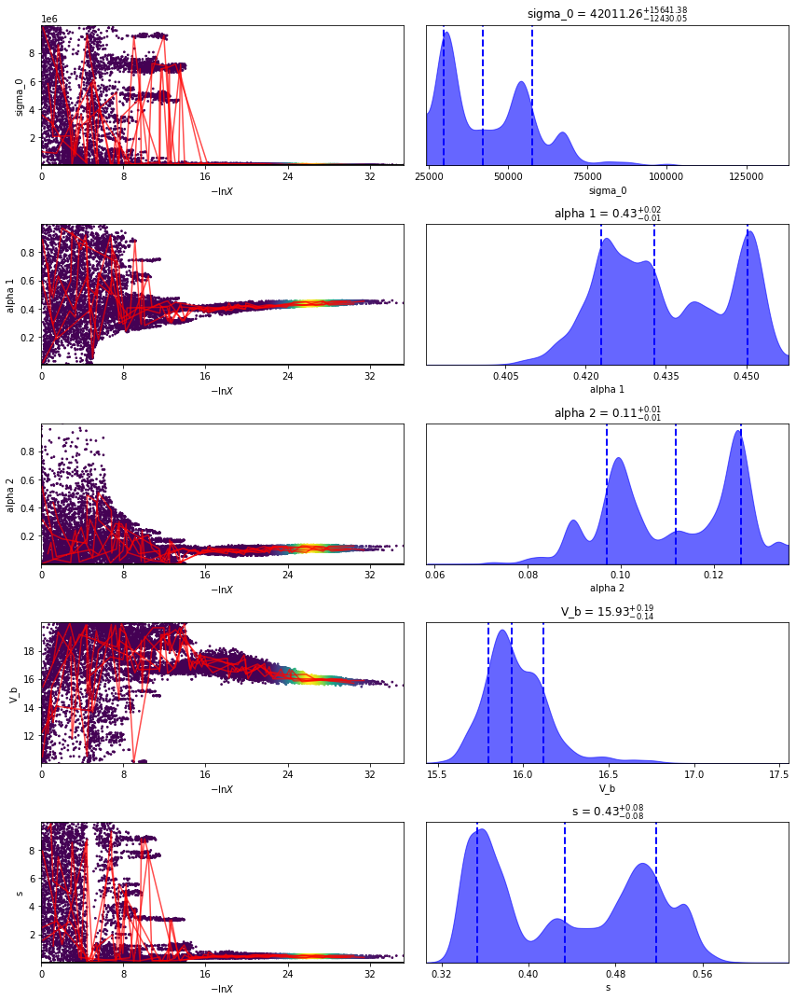

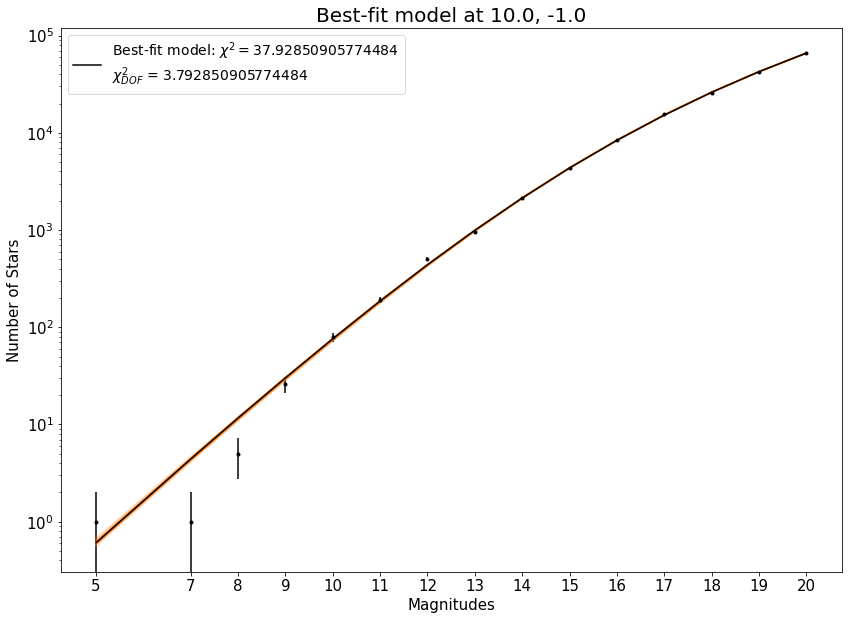

508it [00:00, 5078.89it/s, bound: 0 | nc: 1 | ncall: 1364 | eff(%): 37.243 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/-    nan | dlogz:    inf >  0.509]

15.0 longitude
-1.0 latitude
N3         0.0
N4         0.0
N5         0.0
N6         3.0
N7         2.0
N8        11.0
N9        40.0
N10       92.0
N11      229.0
N12      611.0
N13     1164.0
N14     2332.0
N15     4463.0
N16     7343.0
N17    11255.0
N18    16759.0
N19    25649.0
N20    39475.0
Name: 400, dtype: float64
N3       0.000000
N4       0.000000
N5       0.000000
N6       1.732051
N7       1.414214
N8       3.316625
N9       6.324555
N10      9.591663
N11     15.132746
N12     24.718414
N13     34.117444
N14     48.290786
N15     66.805688
N16     85.691306
N17    106.089585
N18    129.456556
N19    160.153052
N20    198.683165
Name: 400, dtype: float64


28877it [00:48, 598.99it/s, +500 | bound: 379 | nc: 1 | ncall: 695627 | eff(%):  4.226 | loglstar:   -inf < -163.914 <    inf | logz: -221.127 +/-    nan | dlogz:  0.001 >  0.509]


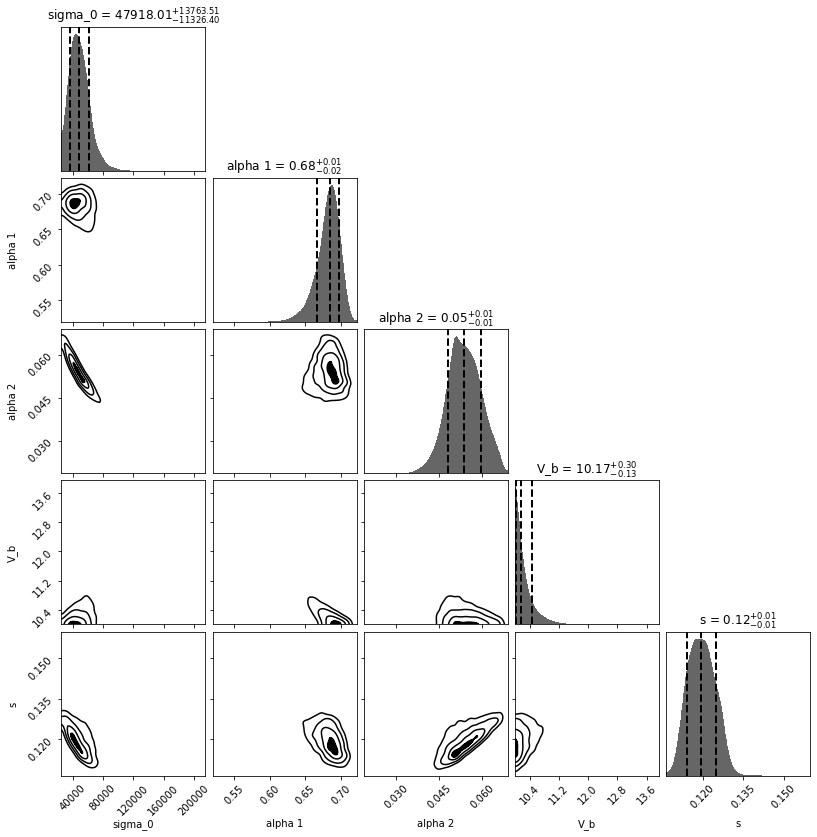

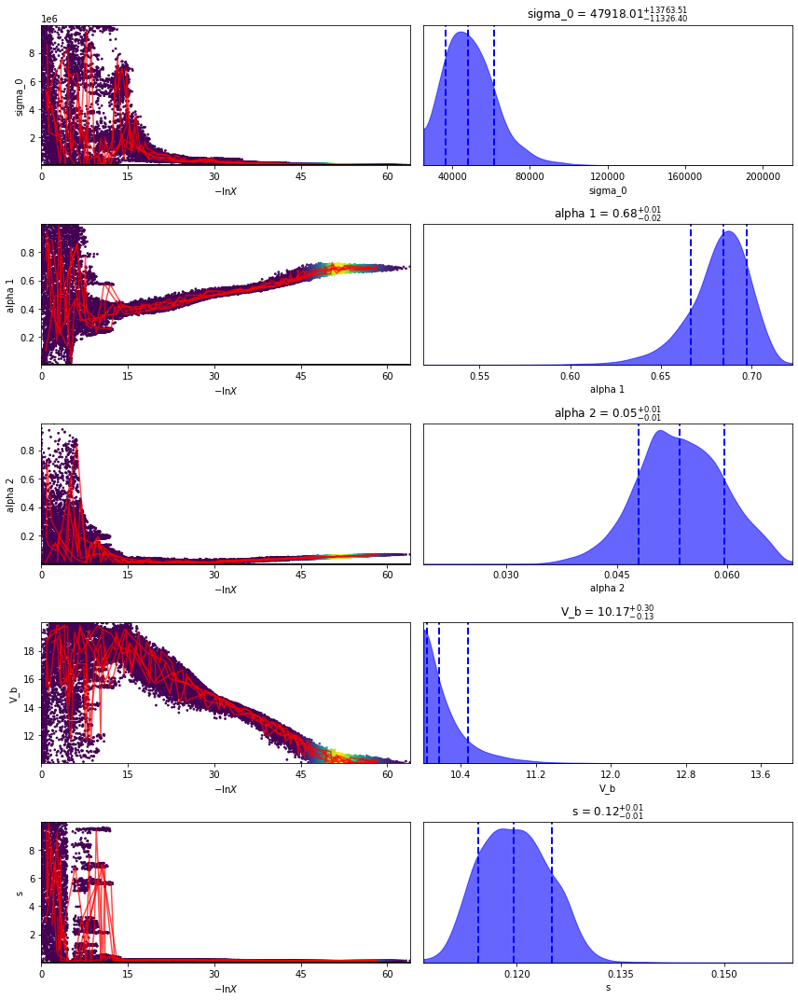

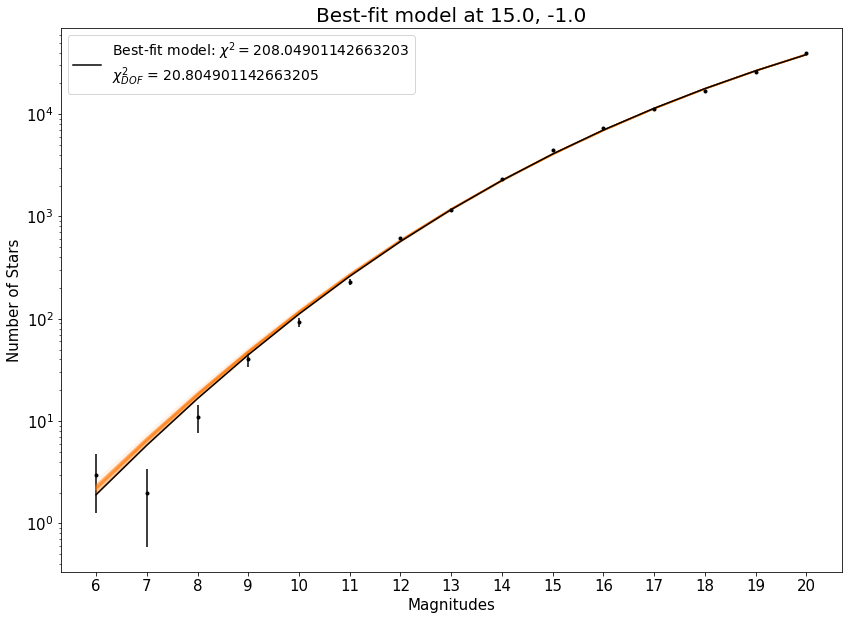

452it [00:00, 4519.45it/s, bound: 0 | nc: 5 | ncall: 1284 | eff(%): 35.202 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/- 172.094 | dlogz:    inf >  0.509]

20.0 longitude
-1.0 latitude
N3         0.0
N4         0.0
N5         1.0
N6         2.0
N7         3.0
N8        12.0
N9        36.0
N10       78.0
N11      202.0
N12      468.0
N13      930.0
N14     1899.0
N15     3487.0
N16     6038.0
N17     9660.0
N18    14226.0
N19    20013.0
N20    27861.0
Name: 401, dtype: float64
N3       0.000000
N4       0.000000
N5       1.000000
N6       1.414214
N7       1.732051
N8       3.464102
N9       6.000000
N10      8.831761
N11     14.212670
N12     21.633308
N13     30.495901
N14     43.577517
N15     59.050826
N16     77.704569
N17     98.285299
N18    119.272797
N19    141.467311
N20    166.916147
Name: 401, dtype: float64


15186it [00:24, 617.85it/s, +500 | bound: 191 | nc: 1 | ncall: 355188 | eff(%):  4.422 | loglstar:   -inf < -65.967 <    inf | logz: -95.651 +/- 172.017 | dlogz:  0.001 >  0.509]  


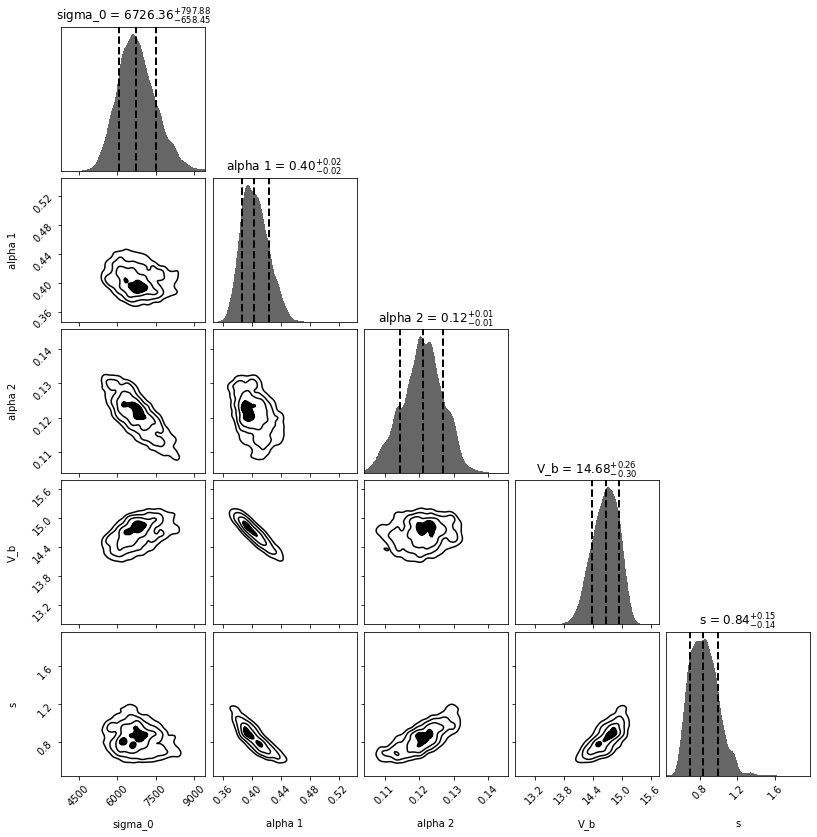

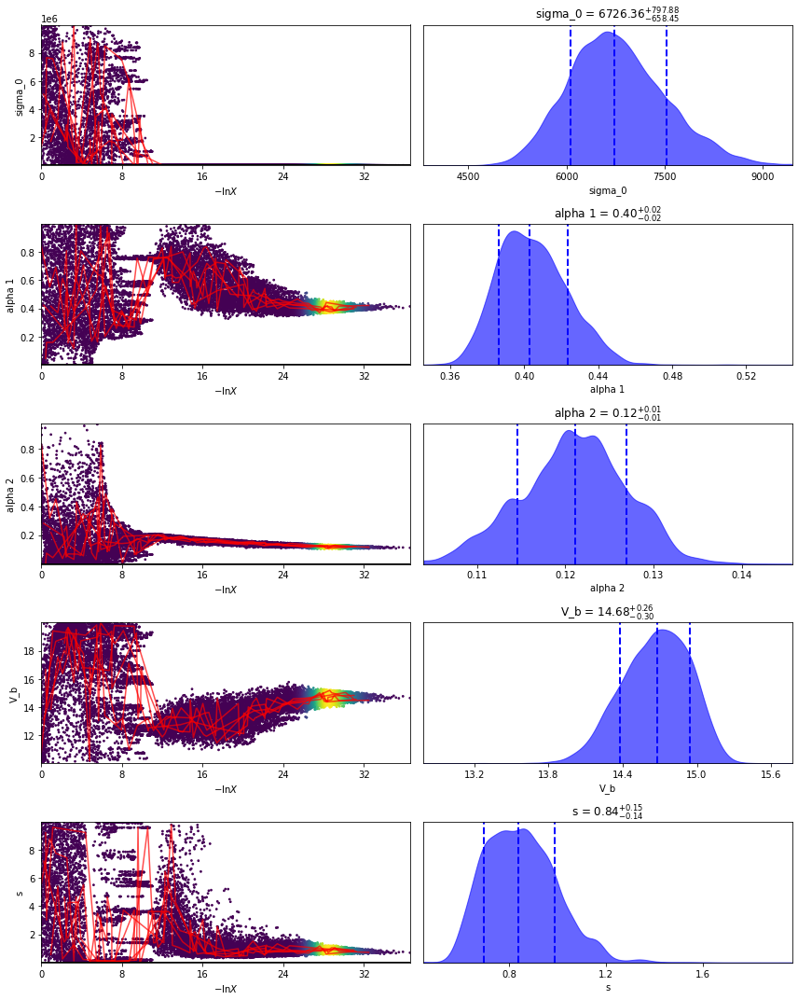

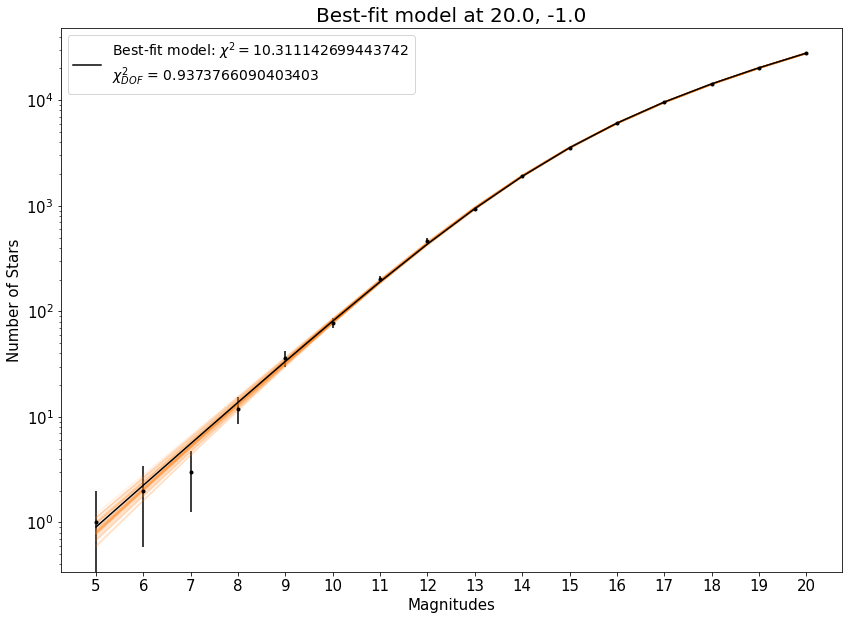

388it [00:00, 3875.36it/s, bound: 0 | nc: 1 | ncall: 1073 | eff(%): 36.160 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/-    nan | dlogz:    inf >  0.509]

30.0 longitude
-1.0 latitude
N3         0.0
N4         0.0
N5         0.0
N6         0.0
N7         3.0
N8         8.0
N9        16.0
N10       34.0
N11       91.0
N12      134.0
N13      369.0
N14      645.0
N15     1166.0
N16     2165.0
N17     3465.0
N18     5934.0
N19     9416.0
N20    14273.0
Name: 402, dtype: float64
N3       0.000000
N4       0.000000
N5       0.000000
N6       0.000000
N7       1.732051
N8       2.828427
N9       4.000000
N10      5.830952
N11      9.539392
N12     11.575837
N13     19.209373
N14     25.396850
N15     34.146742
N16     46.529560
N17     58.864251
N18     77.032461
N19     97.036076
N20    119.469661
Name: 402, dtype: float64


13119it [00:21, 618.70it/s, +500 | bound: 164 | nc: 1 | ncall: 301506 | eff(%):  4.524 | loglstar:   -inf < -64.057 <    inf | logz: -89.609 +/-    nan | dlogz:  0.001 >  0.509]  


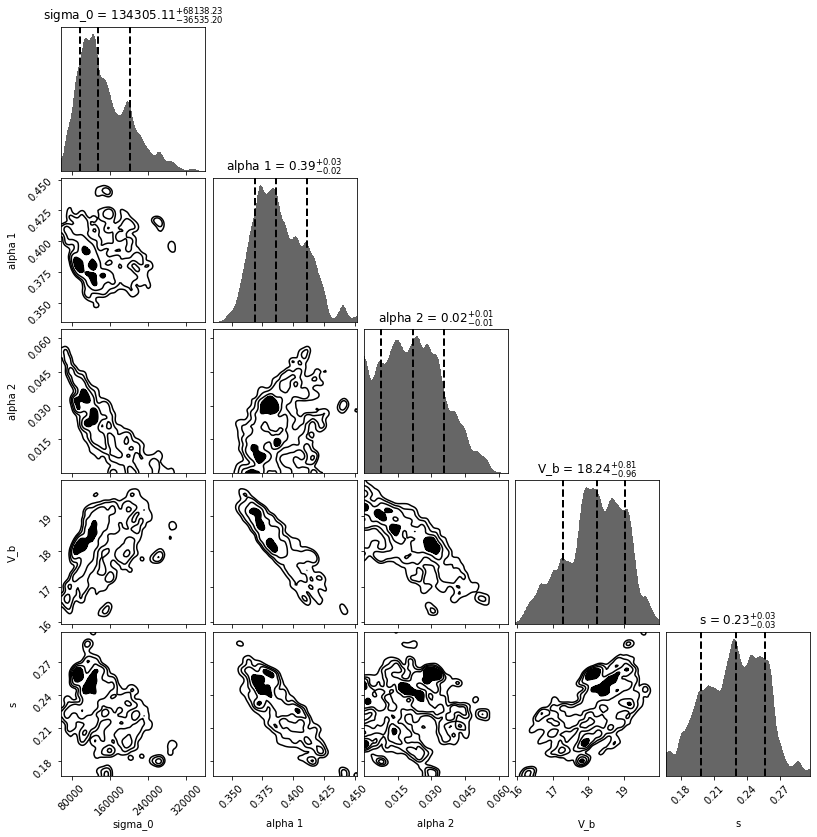

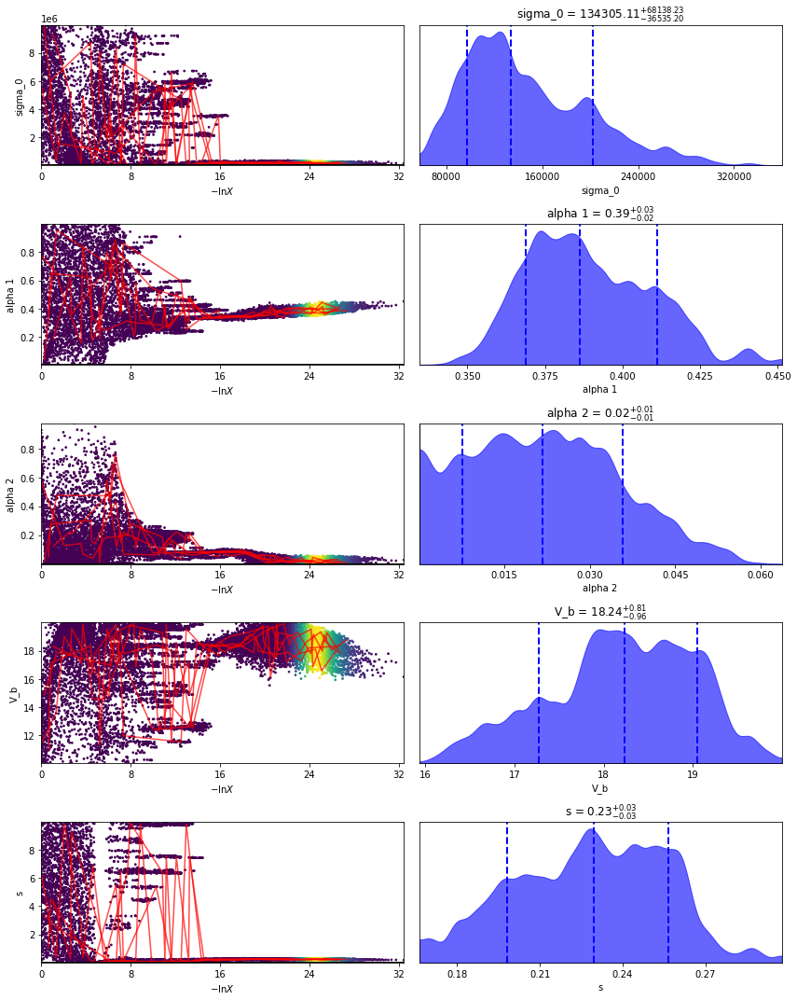

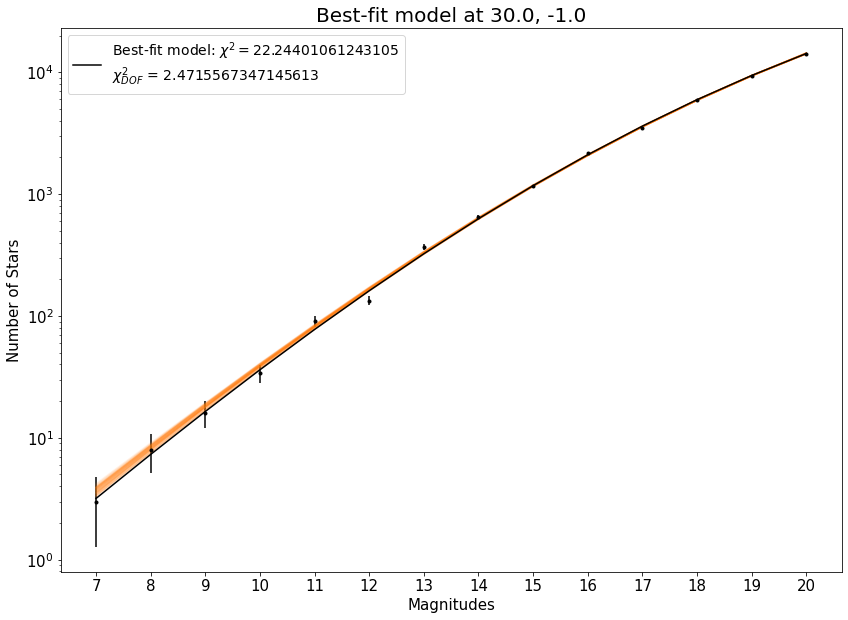

475it [00:00, 4746.72it/s, bound: 0 | nc: 2 | ncall: 1298 | eff(%): 36.595 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/-    nan | dlogz:    inf >  0.509]

50.0 longitude
-1.0 latitude
N3         0.0
N4         1.0
N5         0.0
N6         0.0
N7         3.0
N8         7.0
N9        17.0
N10       51.0
N11      149.0
N12      344.0
N13      706.0
N14     1373.0
N15     2789.0
N16     4951.0
N17     8465.0
N18    14179.0
N19    22338.0
N20    33831.0
Name: 403, dtype: float64
N3       0.000000
N4       1.000000
N5       0.000000
N6       0.000000
N7       1.732051
N8       2.645751
N9       4.123106
N10      7.141428
N11     12.206556
N12     18.547237
N13     26.570661
N14     37.054015
N15     52.810984
N16     70.363343
N17     92.005435
N18    119.075606
N19    149.459024
N20    183.932053
Name: 403, dtype: float64


15359it [00:25, 604.99it/s, +500 | bound: 193 | nc: 1 | ncall: 358424 | eff(%):  4.431 | loglstar:   -inf < -66.800 <    inf | logz: -96.942 +/-    nan | dlogz:  0.001 >  0.509]  


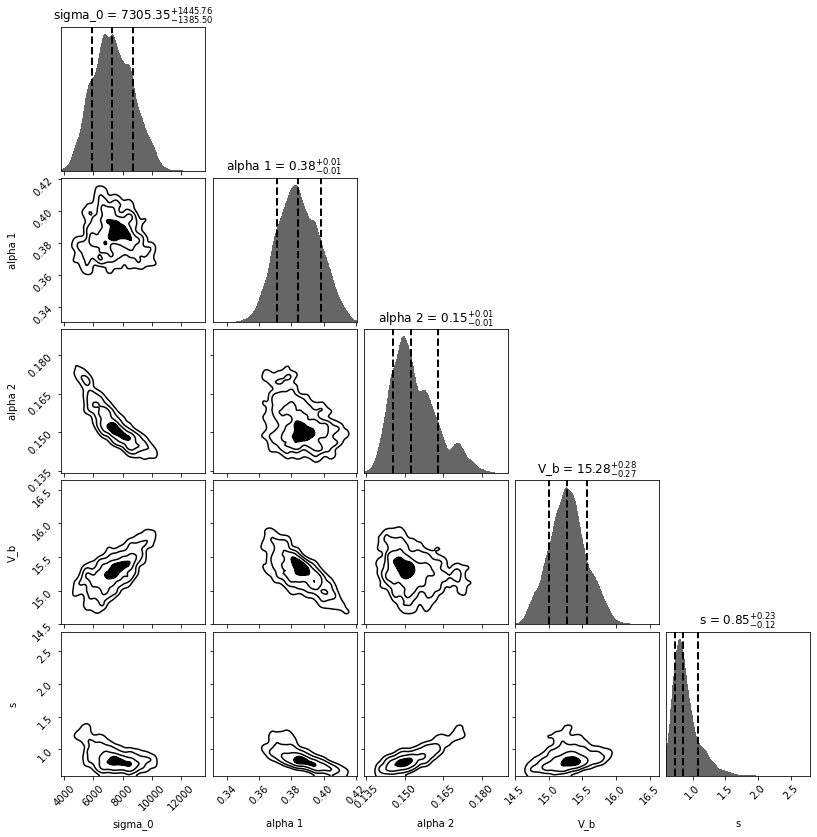

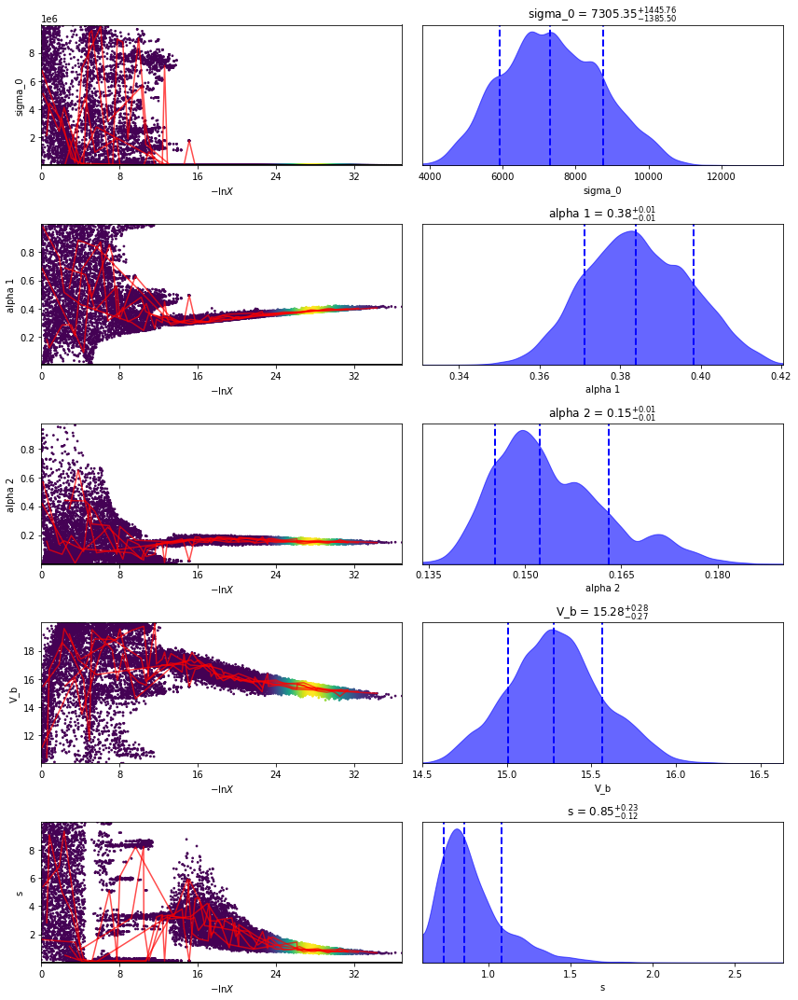

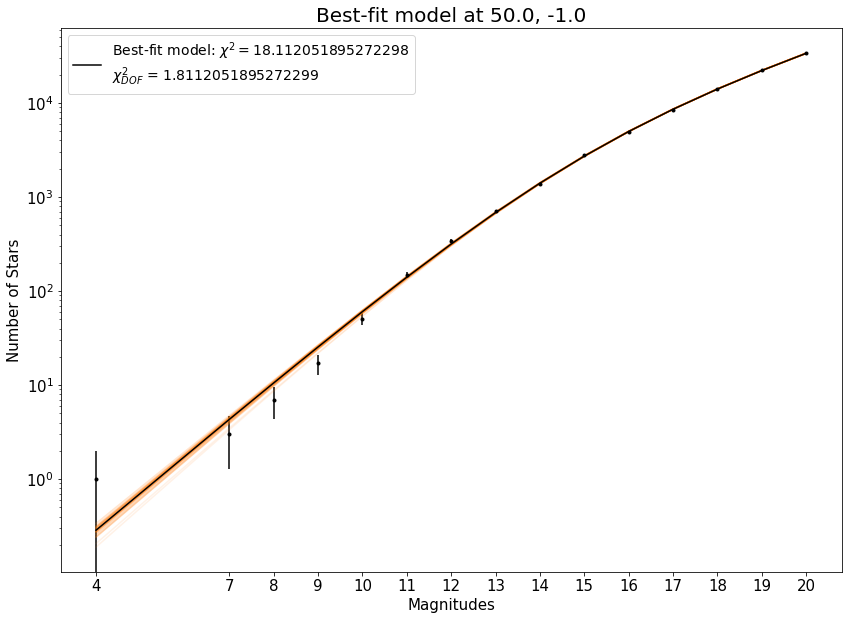

488it [00:00, 4868.80it/s, bound: 0 | nc: 4 | ncall: 1337 | eff(%): 36.500 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/-    nan | dlogz:    inf >  0.509]

70.0 longitude
-1.0 latitude
N3         0.0
N4         0.0
N5         0.0
N6         0.0
N7         2.0
N8        10.0
N9        19.0
N10       69.0
N11      134.0
N12      285.0
N13      643.0
N14     1235.0
N15     2131.0
N16     3722.0
N17     6070.0
N18     9018.0
N19    12720.0
N20    17233.0
Name: 404, dtype: float64
N3       0.000000
N4       0.000000
N5       0.000000
N6       0.000000
N7       1.414214
N8       3.162278
N9       4.358899
N10      8.306624
N11     11.575837
N12     16.881943
N13     25.357445
N14     35.142567
N15     46.162756
N16     61.008196
N17     77.910205
N18     94.963151
N19    112.782977
N20    131.274522
Name: 404, dtype: float64


16599it [00:27, 612.02it/s, +500 | bound: 209 | nc: 1 | ncall: 387821 | eff(%):  4.415 | loglstar:   -inf < -63.237 <    inf | logz: -95.797 +/-    nan | dlogz:  0.001 >  0.509]  


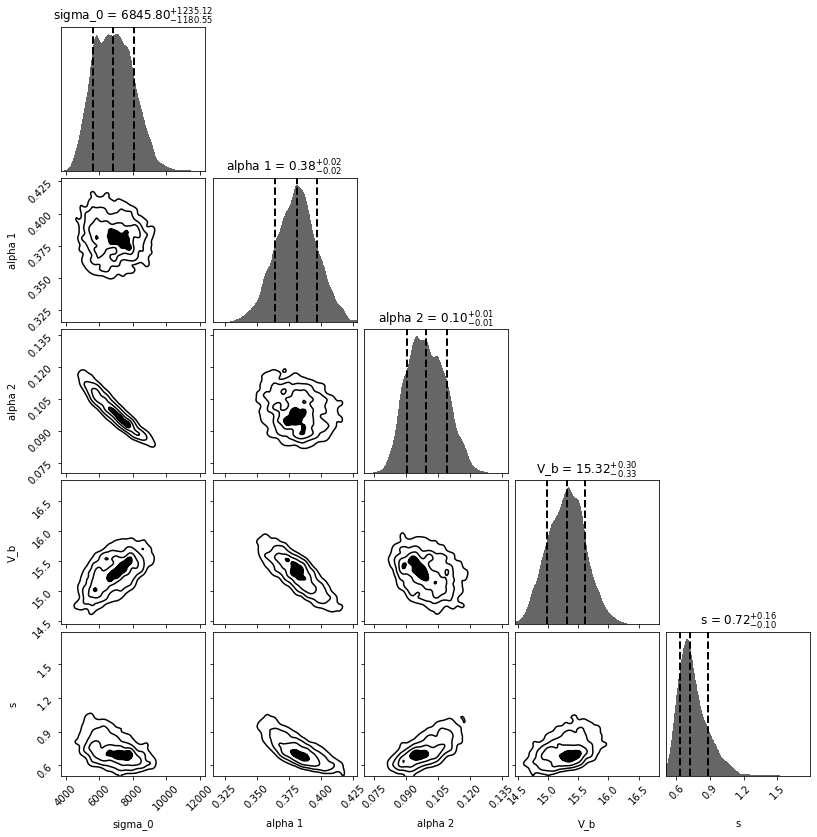

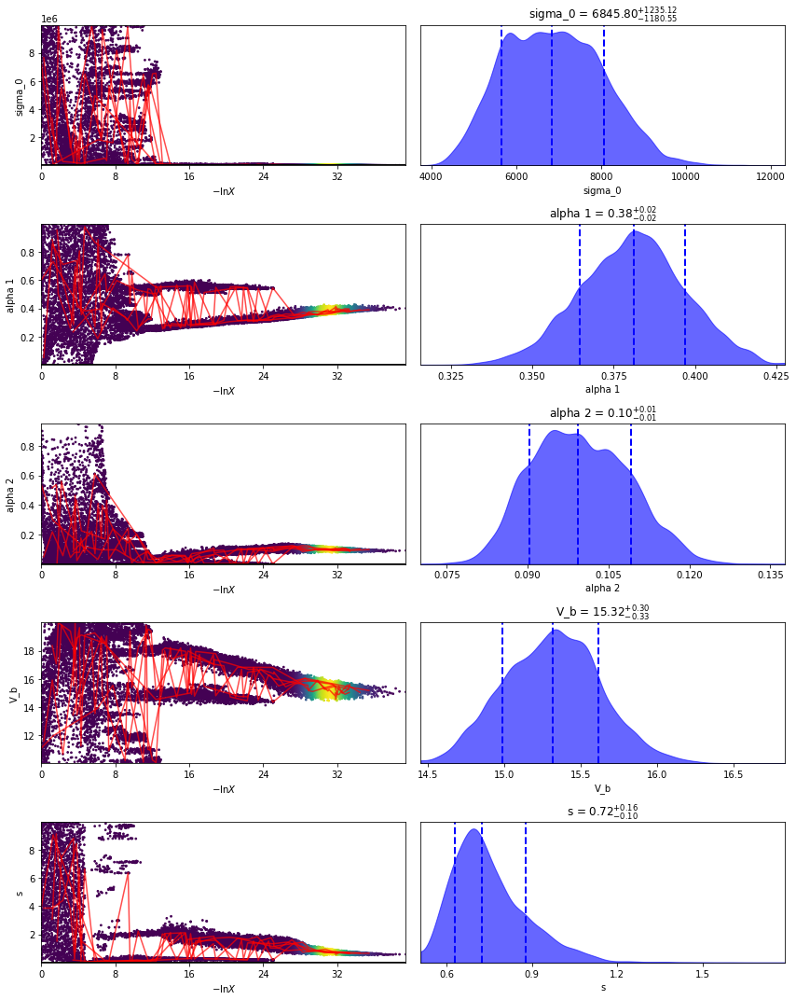

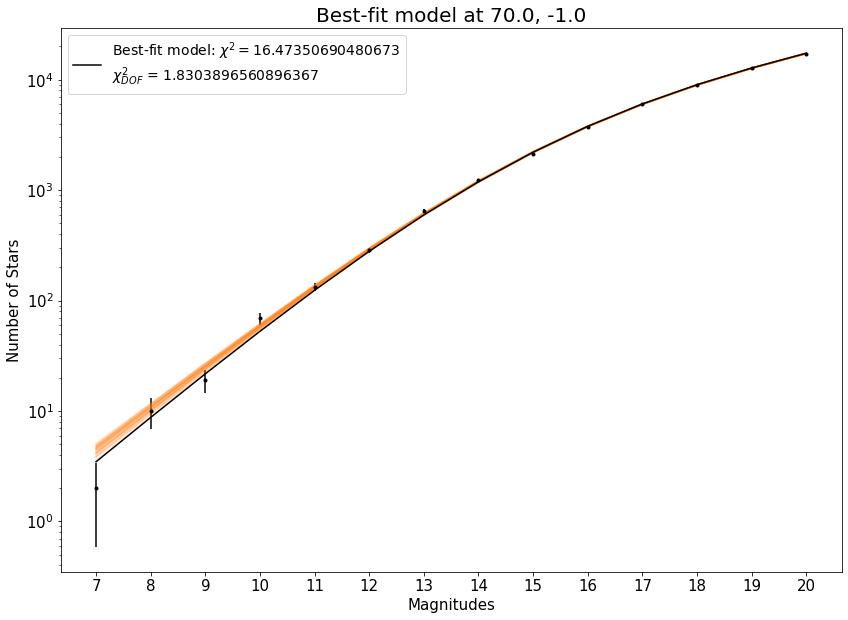

461it [00:00, 4590.09it/s, bound: 0 | nc: 8 | ncall: 1270 | eff(%): 36.299 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/-    nan | dlogz:    inf >  0.509]

90.0 longitude
-1.0 latitude
N3         0.0
N4         0.0
N5         0.0
N6         0.0
N7         2.0
N8        12.0
N9        20.0
N10       59.0
N11      148.0
N12      302.0
N13      690.0
N14     1550.0
N15     2986.0
N16     5173.0
N17     9037.0
N18    15236.0
N19    23246.0
N20    32436.0
Name: 405, dtype: float64
N3       0.000000
N4       0.000000
N5       0.000000
N6       0.000000
N7       1.414214
N8       3.464102
N9       4.472136
N10      7.681146
N11     12.165525
N12     17.378147
N13     26.267851
N14     39.370039
N15     54.644304
N16     71.923571
N17     95.063137
N18    123.434193
N19    152.466390
N20    180.099972
Name: 405, dtype: float64


16653it [00:27, 610.49it/s, +500 | bound: 211 | nc: 1 | ncall: 389698 | eff(%):  4.407 | loglstar:   -inf < -77.752 <    inf | logz: -110.470 +/-    nan | dlogz:  0.001 >  0.509] 


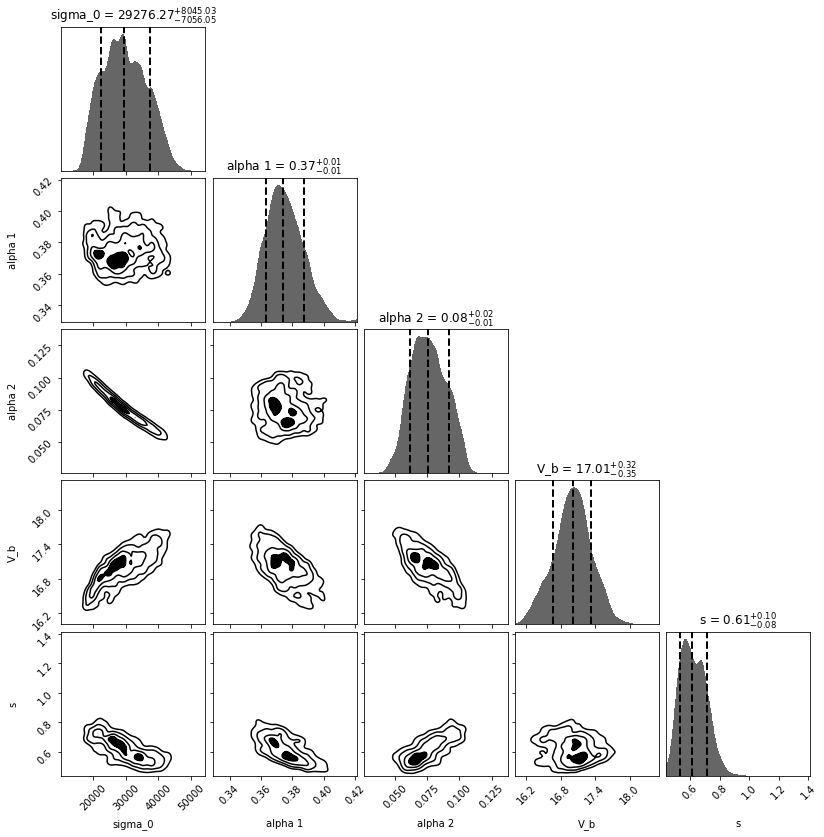

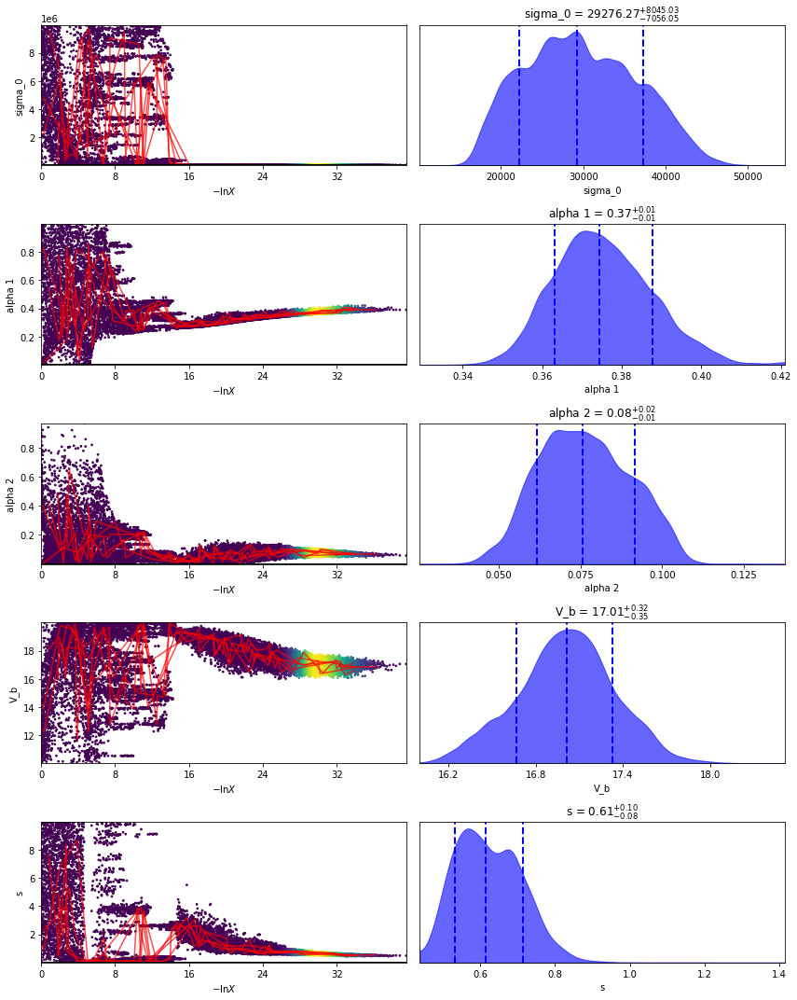

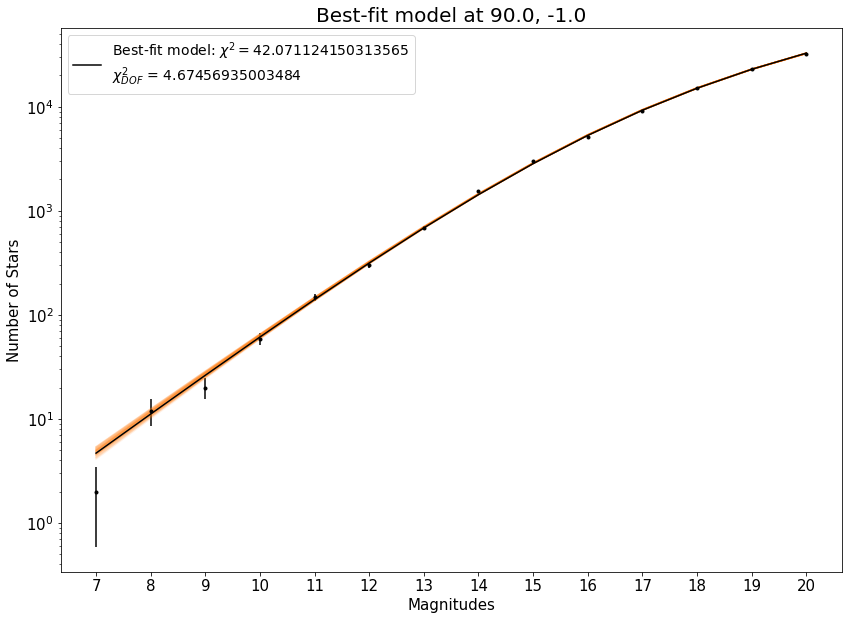

520it [00:00, 5194.12it/s, bound: 0 | nc: 1 | ncall: 1448 | eff(%): 35.912 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/- 25.302 | dlogz:    inf >  0.509]

120.0 longitude
-1.0 latitude
N3         0.0
N4         0.0
N5         0.0
N6         1.0
N7         0.0
N8         2.0
N9        19.0
N10       36.0
N11      130.0
N12      341.0
N13      778.0
N14     1832.0
N15     3439.0
N16     6537.0
N17    11408.0
N18    17773.0
N19    24185.0
N20    28643.0
Name: 406, dtype: float64
N3       0.000000
N4       0.000000
N5       0.000000
N6       1.000000
N7       0.000000
N8       1.414214
N9       4.358899
N10      6.000000
N11     11.401754
N12     18.466185
N13     27.892651
N14     42.801869
N15     58.642988
N16     80.851716
N17    106.808239
N18    133.315415
N19    155.515273
N20    169.242430
Name: 406, dtype: float64


16220it [00:27, 600.53it/s, +500 | bound: 205 | nc: 1 | ncall: 378825 | eff(%):  4.419 | loglstar:   -inf < -94.279 <    inf | logz: -126.061 +/- 24.987 | dlogz:  0.001 >  0.509] 


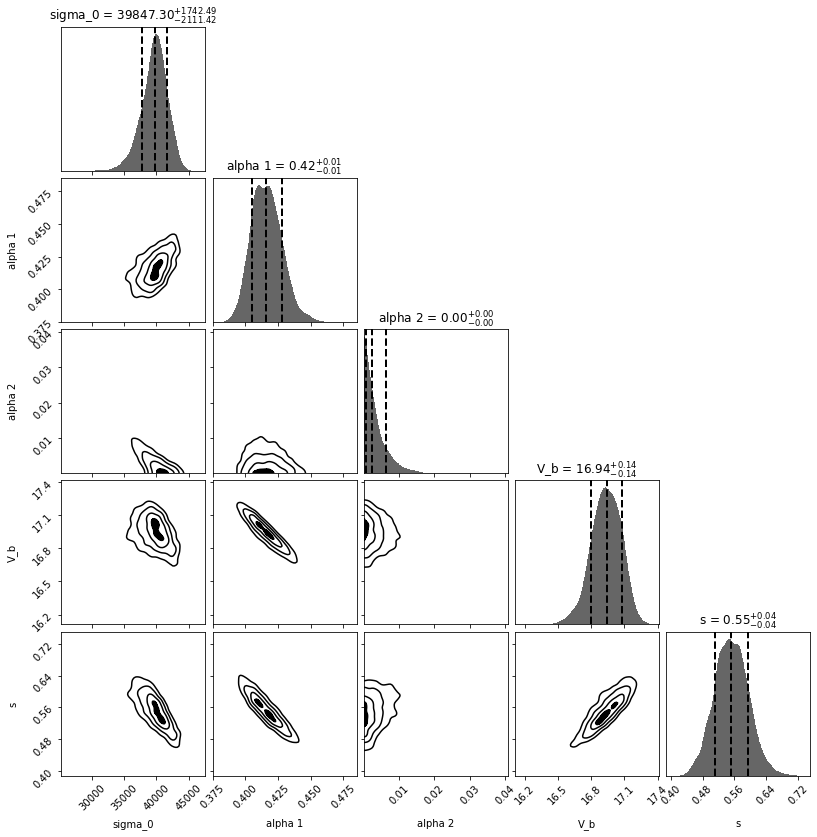

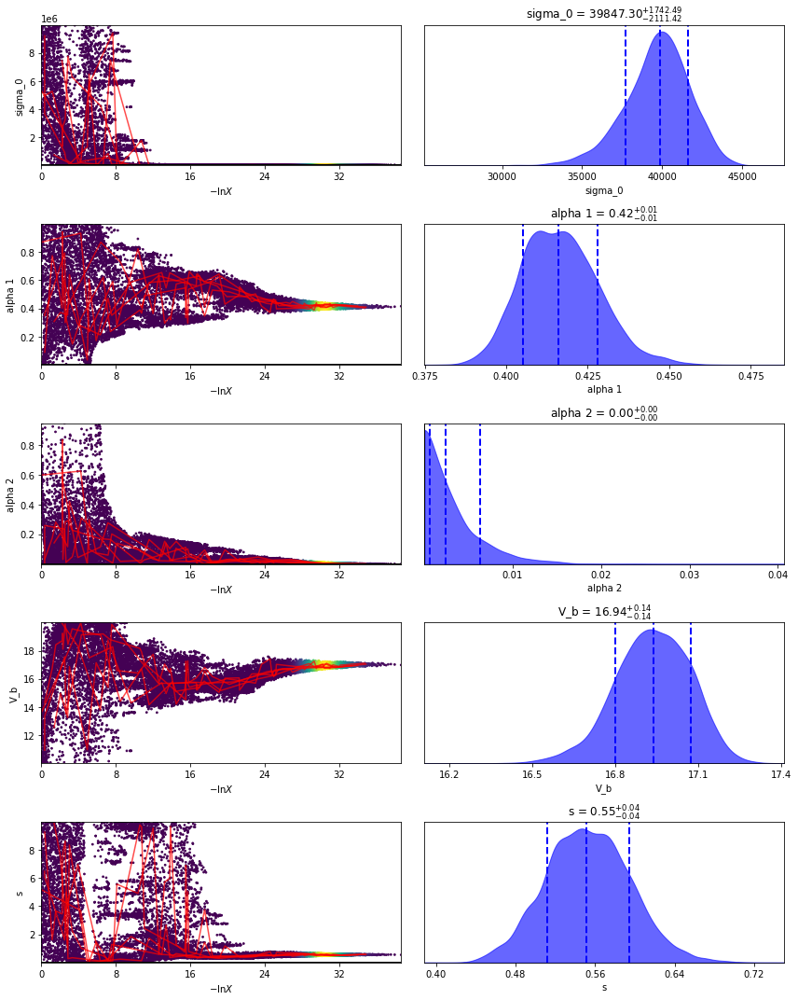

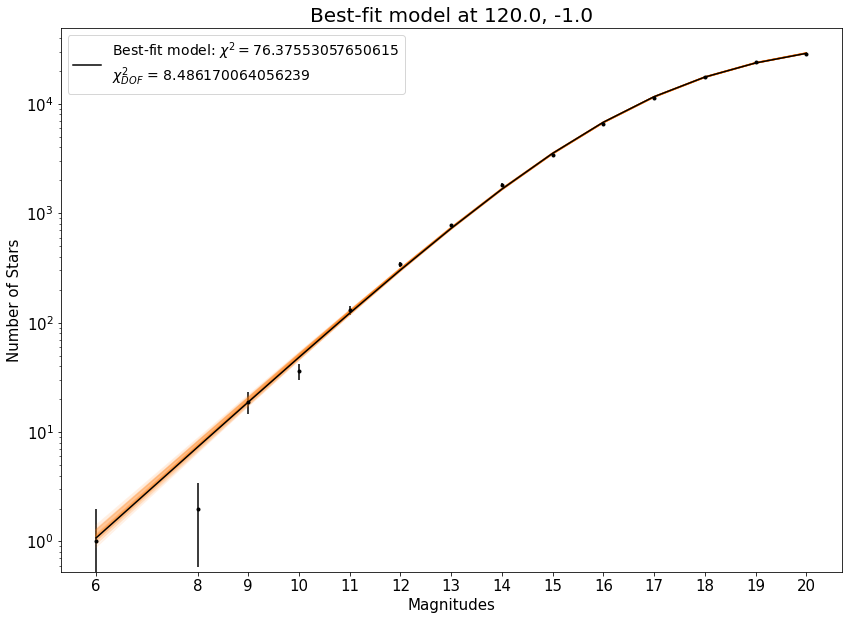

475it [00:00, 4731.09it/s, bound: 0 | nc: 7 | ncall: 1331 | eff(%): 35.687 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/-    nan | dlogz:    inf >  0.509]

150.0 longitude
-1.0 latitude
N3         0.0
N4         0.0
N5         0.0
N6         0.0
N7         1.0
N8         3.0
N9        16.0
N10       33.0
N11      103.0
N12      265.0
N13      650.0
N14     1291.0
N15     2410.0
N16     4414.0
N17     7308.0
N18    10950.0
N19    14300.0
N20    17078.0
Name: 407, dtype: float64
N3       0.000000
N4       0.000000
N5       0.000000
N6       0.000000
N7       1.000000
N8       1.732051
N9       4.000000
N10      5.744563
N11     10.148892
N12     16.278821
N13     25.495098
N14     35.930488
N15     49.091751
N16     66.437941
N17     85.486841
N18    104.642248
N19    119.582607
N20    130.682822
Name: 407, dtype: float64


15962it [00:26, 613.86it/s, +500 | bound: 198 | nc: 1 | ncall: 373605 | eff(%):  4.412 | loglstar:   -inf < -71.844 <    inf | logz: -103.130 +/-    nan | dlogz:  0.001 >  0.509] 


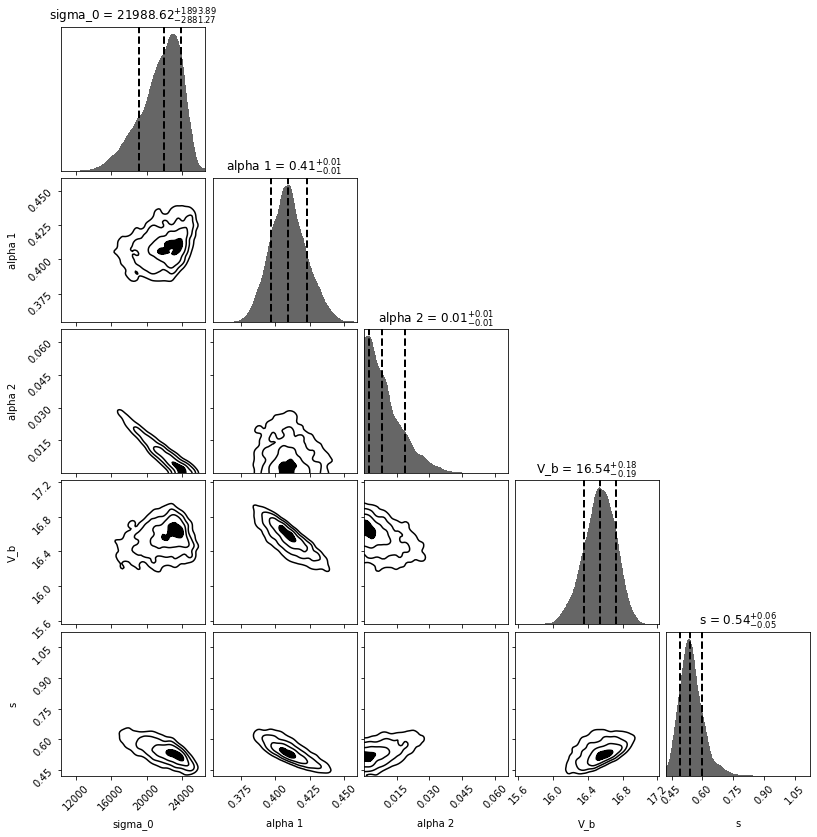

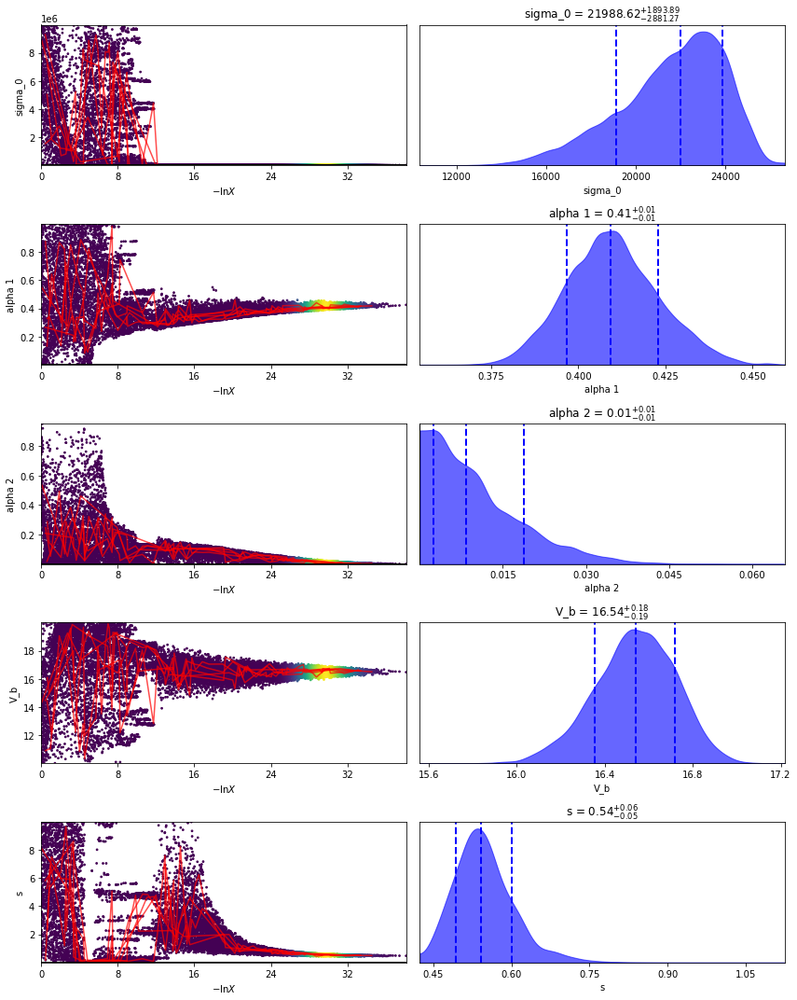

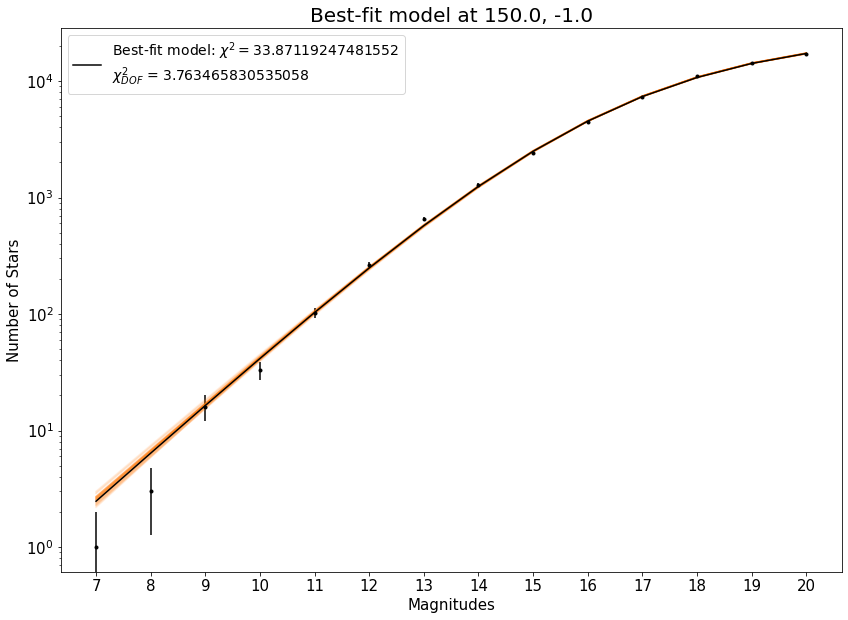

475it [00:00, 4742.64it/s, bound: 0 | nc: 1 | ncall: 1276 | eff(%): 37.226 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/-    nan | dlogz:    inf >  0.509]

180.0 longitude
-1.0 latitude
N3         0.0
N4         0.0
N5         2.0
N6         0.0
N7         1.0
N8         4.0
N9         8.0
N10       24.0
N11       94.0
N12      257.0
N13      590.0
N14     1201.0
N15     2209.0
N16     3981.0
N17     6543.0
N18     9574.0
N19    12334.0
N20    14871.0
Name: 408, dtype: float64
N3       0.000000
N4       0.000000
N5       1.414214
N6       0.000000
N7       1.000000
N8       2.000000
N9       2.828427
N10      4.898979
N11      9.695360
N12     16.031220
N13     24.289916
N14     34.655447
N15     47.000000
N16     63.095166
N17     80.888813
N18     97.846819
N19    111.058543
N20    121.946710
Name: 408, dtype: float64


17112it [00:28, 603.01it/s, +500 | bound: 217 | nc: 1 | ncall: 400954 | eff(%):  4.398 | loglstar:   -inf < -71.762 <    inf | logz: -105.380 +/-    nan | dlogz:  0.001 >  0.509] 


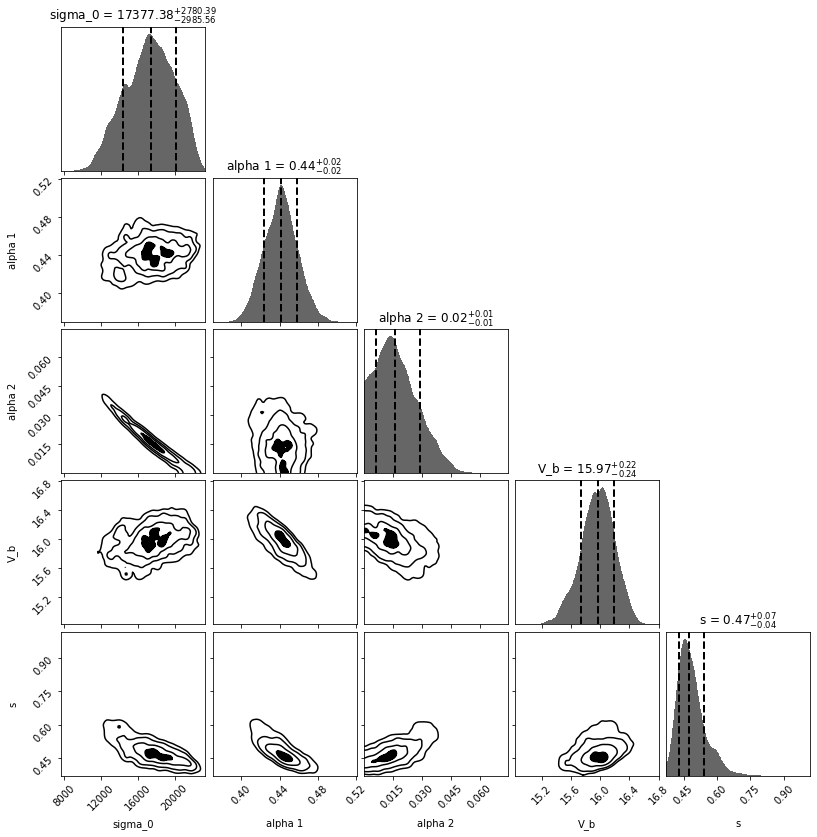

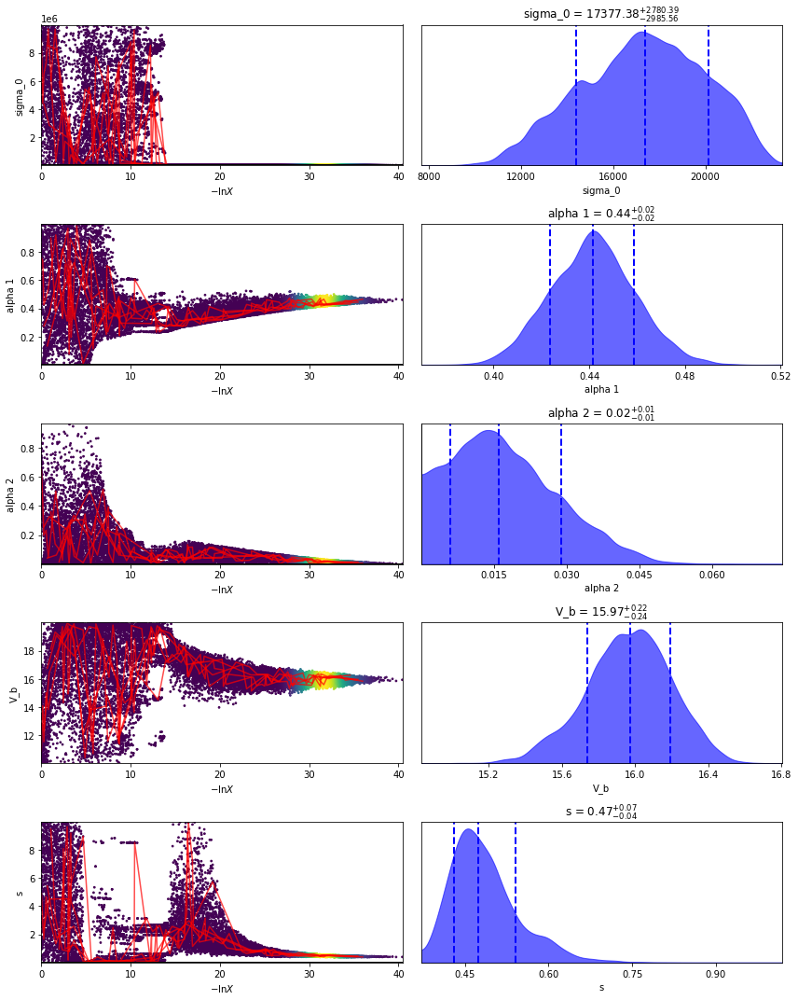

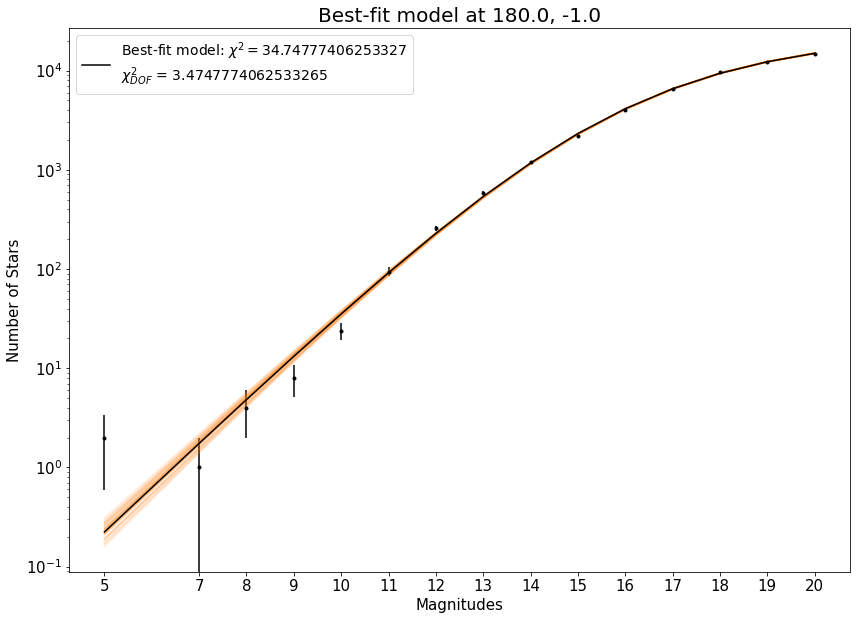

480it [00:00, 4795.97it/s, bound: 0 | nc: 4 | ncall: 1306 | eff(%): 36.753 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/-    nan | dlogz:    inf >  0.509]

210.0 longitude
-1.0 latitude
N3         0.0
N4         0.0
N5         0.0
N6         0.0
N7         5.0
N8         6.0
N9        14.0
N10       32.0
N11      123.0
N12      260.0
N13      655.0
N14     1334.0
N15     2637.0
N16     4510.0
N17     7916.0
N18    11635.0
N19    15515.0
N20    18419.0
Name: 409, dtype: float64
N3       0.000000
N4       0.000000
N5       0.000000
N6       0.000000
N7       2.236068
N8       2.449490
N9       3.741657
N10      5.656854
N11     11.090537
N12     16.124515
N13     25.592968
N14     36.523965
N15     51.351728
N16     67.156534
N17     88.971906
N18    107.865657
N19    124.559223
N20    135.716617
Name: 409, dtype: float64


16026it [00:25, 618.61it/s, +500 | bound: 198 | nc: 1 | ncall: 373533 | eff(%):  4.430 | loglstar:   -inf < -75.756 <    inf | logz: -107.173 +/-    nan | dlogz:  0.001 >  0.509] 


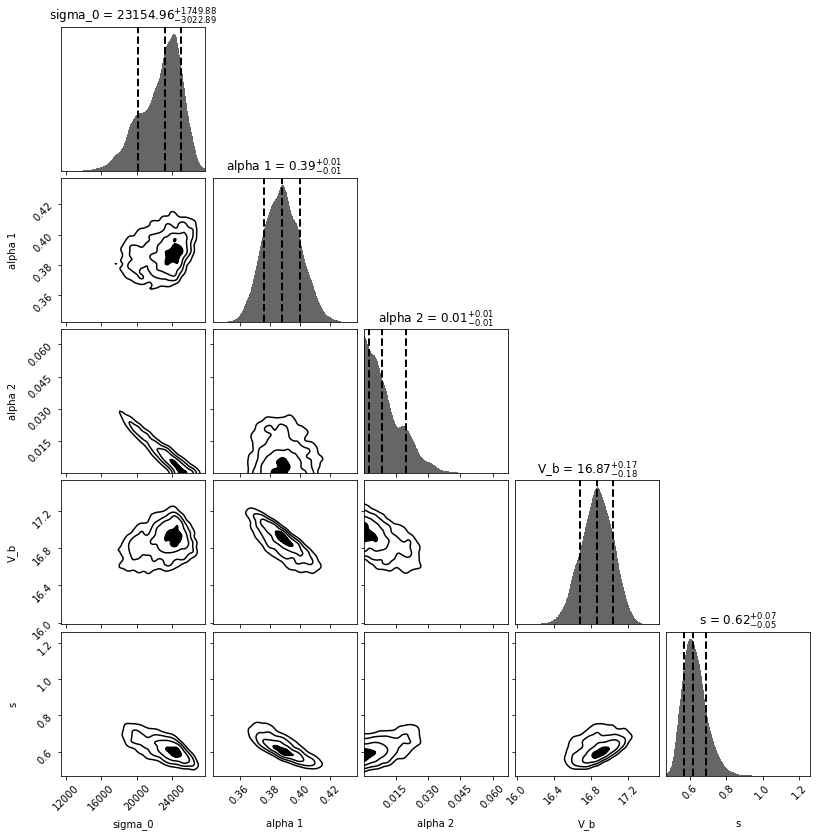

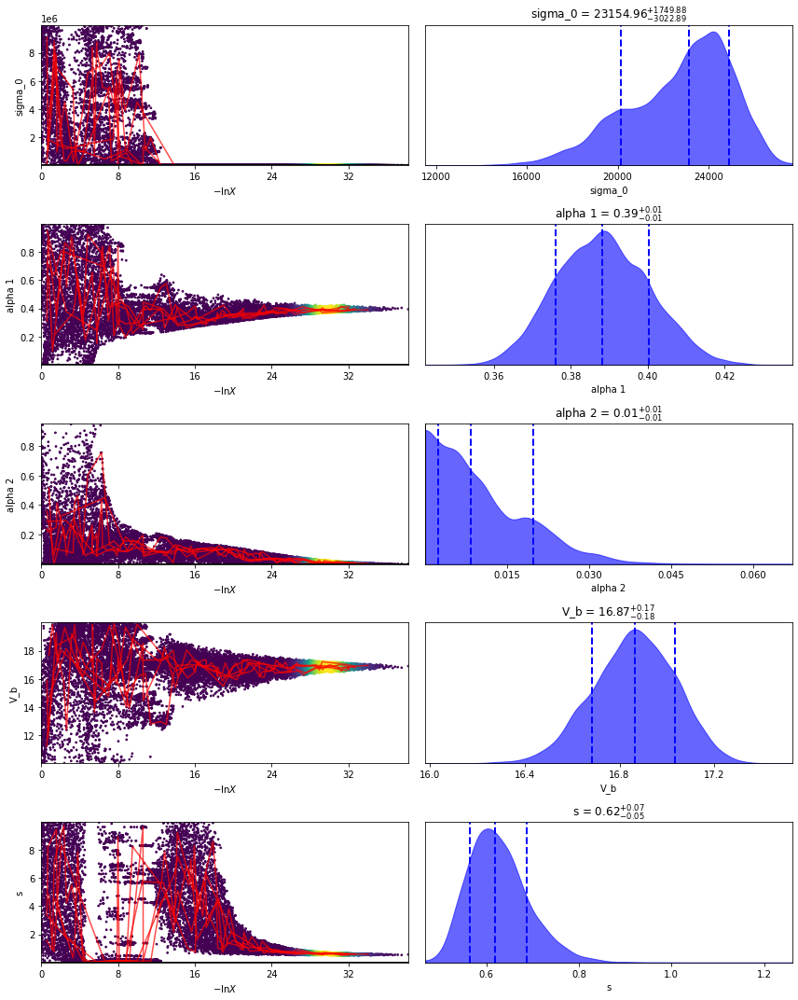

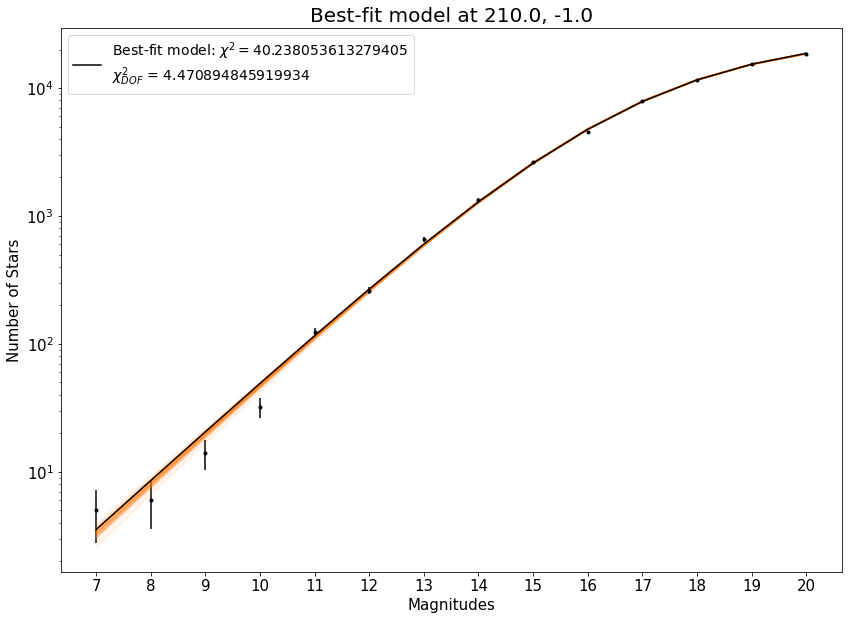

483it [00:00, 4815.85it/s, bound: 0 | nc: 7 | ncall: 1325 | eff(%): 36.453 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/- 57.330 | dlogz:    inf >  0.509]

240.0 longitude
-1.0 latitude
N3         0.0
N4         0.0
N5         0.0
N6         2.0
N7         5.0
N8         7.0
N9        15.0
N10       45.0
N11      161.0
N12      392.0
N13      961.0
N14     2083.0
N15     4030.0
N16     7658.0
N17    13399.0
N18    20765.0
N19    28689.0
N20    34416.0
Name: 410, dtype: float64
N3       0.000000
N4       0.000000
N5       0.000000
N6       1.414214
N7       2.236068
N8       2.645751
N9       3.872983
N10      6.708204
N11     12.688578
N12     19.798990
N13     31.000000
N14     45.639895
N15     63.482281
N16     87.509999
N17    115.754050
N18    144.100659
N19    169.378275
N20    185.515498
Name: 410, dtype: float64


15721it [00:27, 575.00it/s, +500 | bound: 198 | nc: 1 | ncall: 367063 | eff(%):  4.425 | loglstar:   -inf < -89.261 <    inf | logz: -120.030 +/- 57.605 | dlogz:  0.001 >  0.509] 


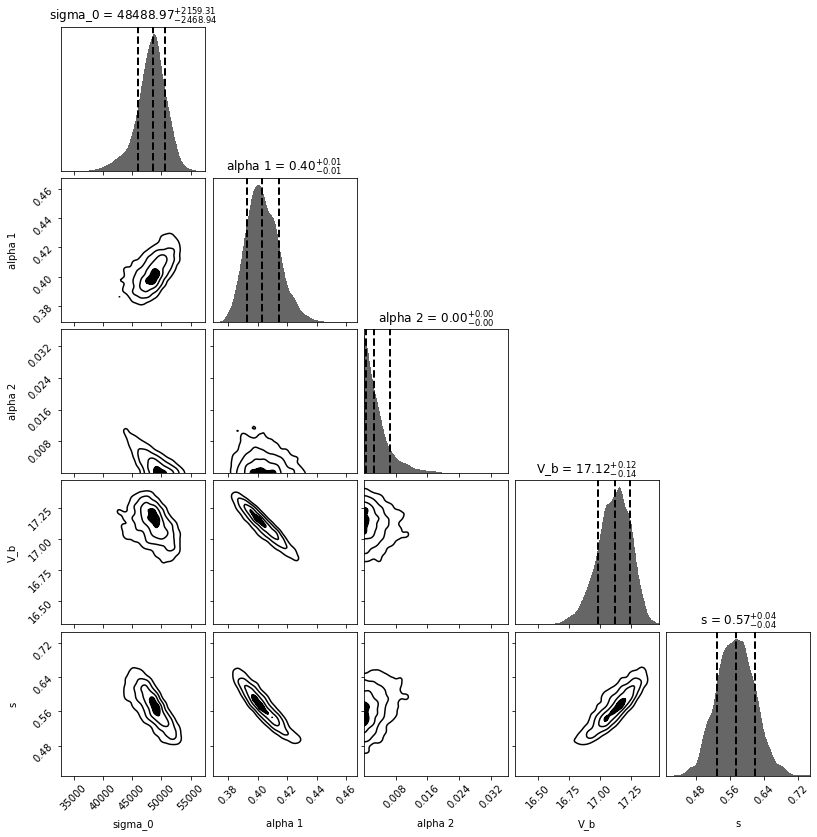

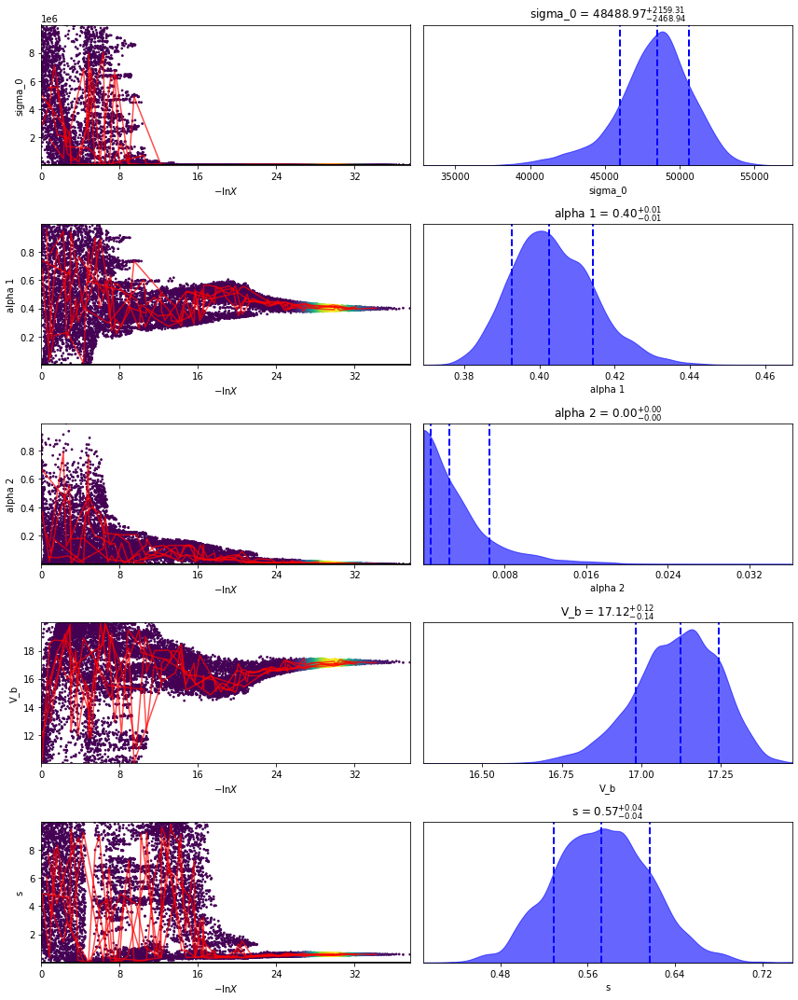

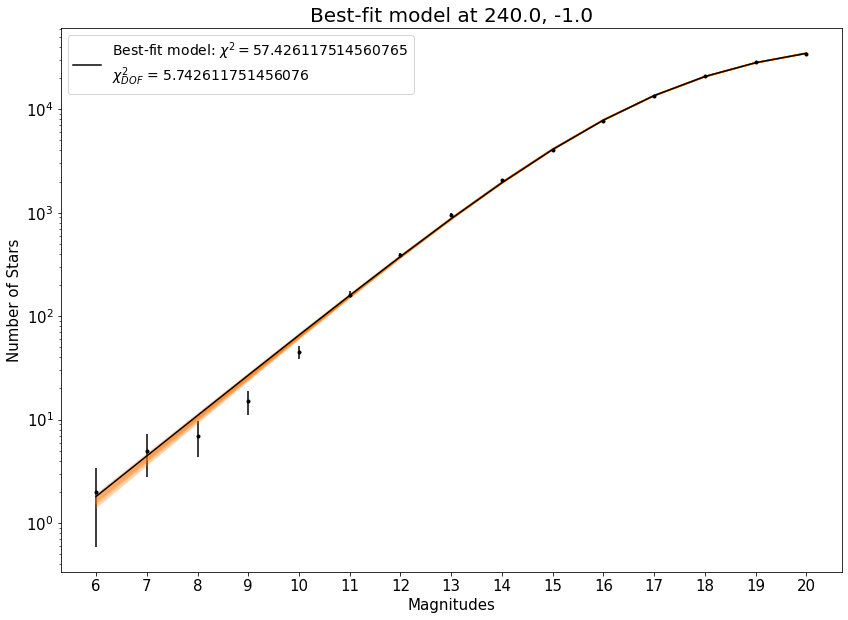

433it [00:00, 4323.91it/s, bound: 0 | nc: 1 | ncall: 1173 | eff(%): 36.914 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/- 331.701 | dlogz:    inf >  0.509]

270.0 longitude
-1.0 latitude
N3        0.0
N4        0.0
N5        0.0
N6        2.0
N7        3.0
N8        7.0
N9       16.0
N10      35.0
N11      79.0
N12     138.0
N13     335.0
N14     568.0
N15     994.0
N16    1619.0
N17    2431.0
N18    3455.0
N19    4744.0
N20    6550.0
Name: 411, dtype: float64
N3      0.000000
N4      0.000000
N5      0.000000
N6      1.414214
N7      1.732051
N8      2.645751
N9      4.000000
N10     5.916080
N11     8.888194
N12    11.747340
N13    18.303005
N14    23.832751
N15    31.527766
N16    40.236799
N17    49.305172
N18    58.779248
N19    68.876701
N20    80.932070
Name: 411, dtype: float64


20310it [00:34, 587.90it/s, +500 | bound: 268 | nc: 1 | ncall: 480632 | eff(%):  4.334 | loglstar:   -inf < -59.559 <    inf | logz: -99.404 +/- 330.653 | dlogz:  0.001 >  0.509]  


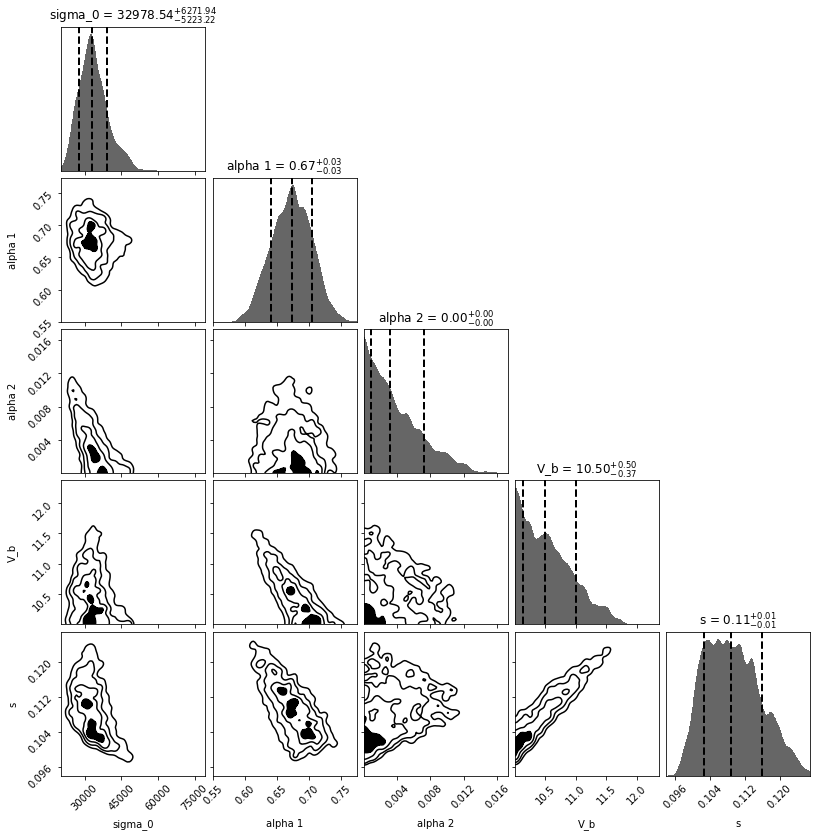

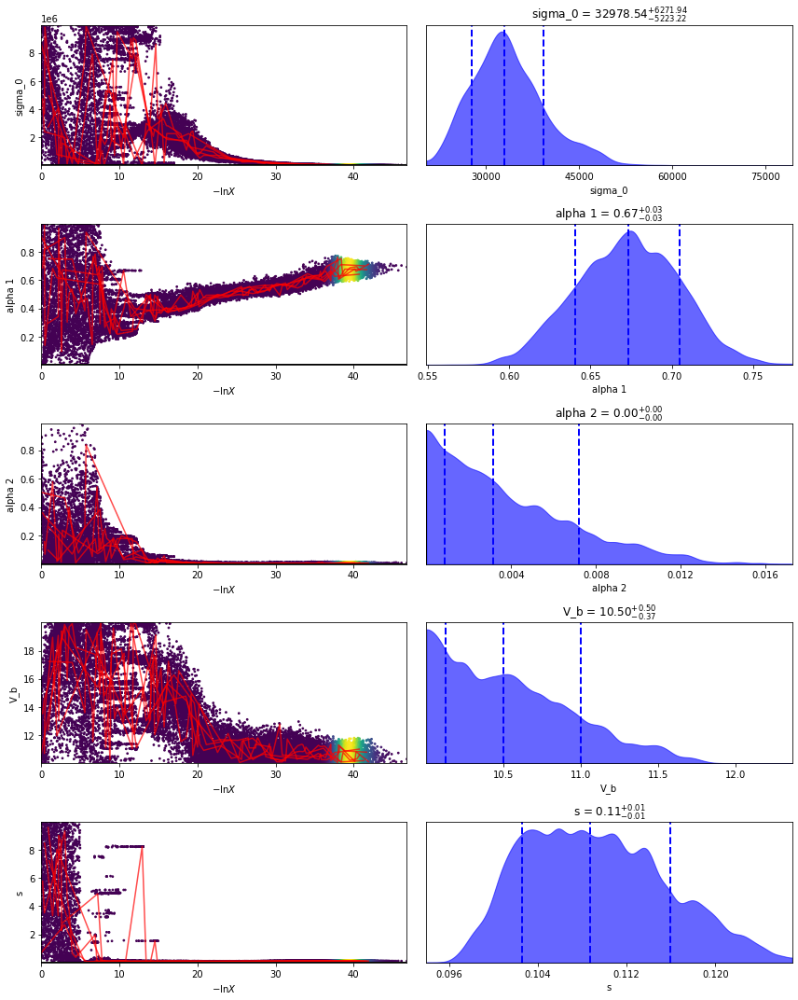

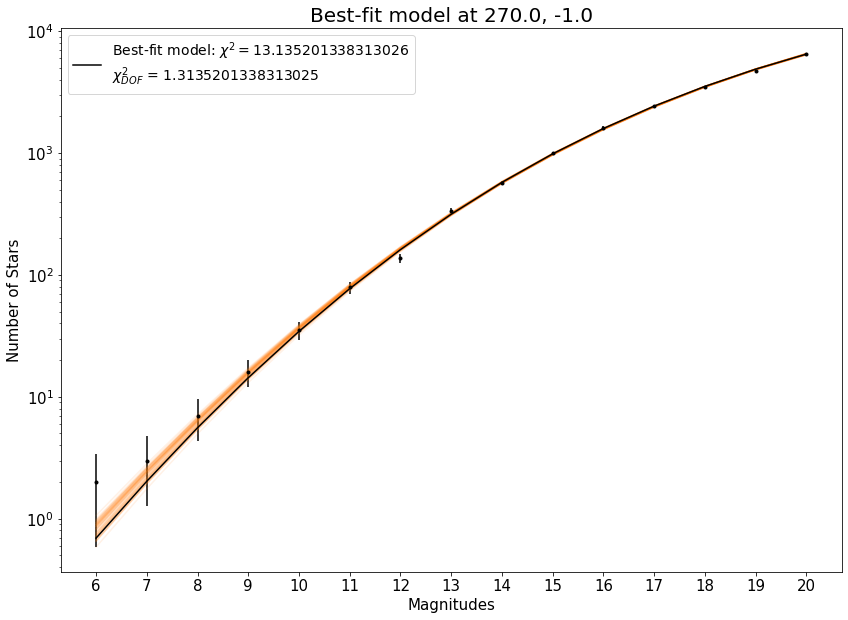

463it [00:00, 4628.10it/s, bound: 0 | nc: 1 | ncall: 1304 | eff(%): 35.506 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/-    nan | dlogz:    inf >  0.509]

290.0 longitude
-1.0 latitude
N3         0.0
N4         0.0
N5         0.0
N6         0.0
N7         5.0
N8        11.0
N9        17.0
N10      109.0
N11      310.0
N12      734.0
N13     1794.0
N14     4076.0
N15     7990.0
N16    15328.0
N17    27296.0
N18    44552.0
N19    65666.0
N20    88969.0
Name: 412, dtype: float64
N3       0.000000
N4       0.000000
N5       0.000000
N6       0.000000
N7       2.236068
N8       3.316625
N9       4.123106
N10     10.440307
N11     17.606817
N12     27.092434
N13     42.355637
N14     63.843559
N15     89.386800
N16    123.806300
N17    165.215011
N18    211.073447
N19    256.253780
N20    298.276717
Name: 412, dtype: float64


15524it [00:25, 608.81it/s, +500 | bound: 191 | nc: 1 | ncall: 361587 | eff(%):  4.438 | loglstar:   -inf < -93.791 <    inf | logz: -124.219 +/-    nan | dlogz:  0.001 >  0.509]  


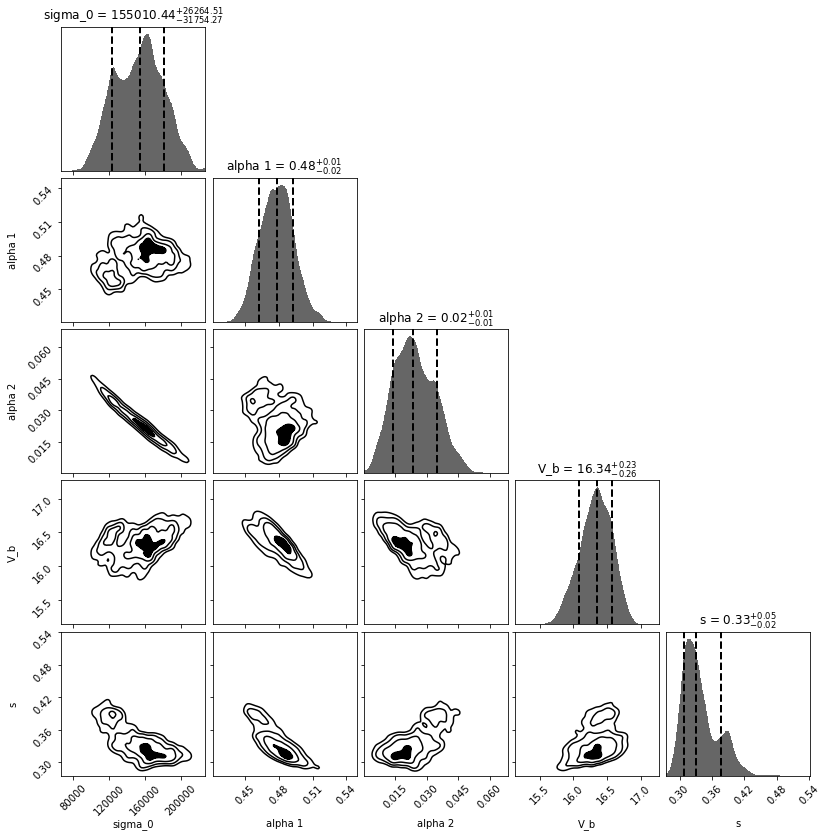

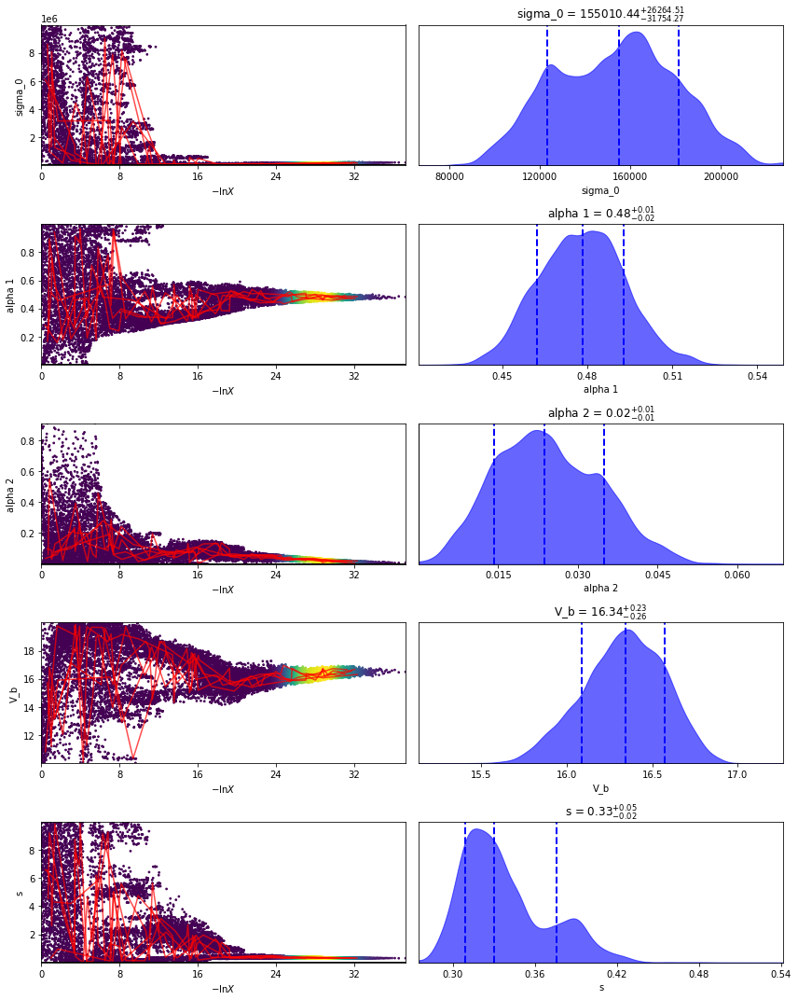

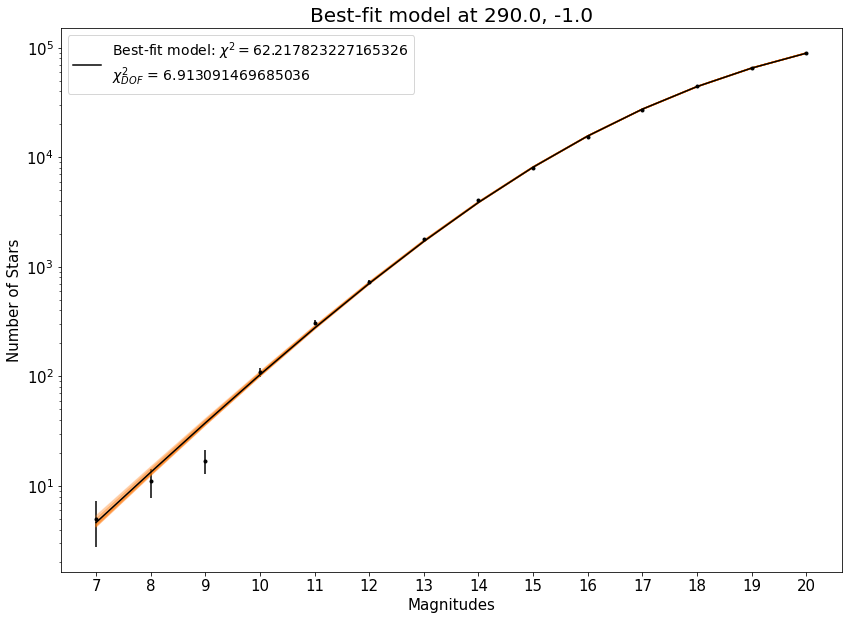

509it [00:00, 5084.86it/s, bound: 0 | nc: 1 | ncall: 1389 | eff(%): 36.645 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/- 49.403 | dlogz:    inf >  0.509]

310.0 longitude
-1.0 latitude
N3         0.0
N4         0.0
N5         0.0
N6         3.0
N7         5.0
N8         6.0
N9        21.0
N10       77.0
N11      195.0
N12      412.0
N13      832.0
N14     1805.0
N15     3582.0
N16     6394.0
N17    10286.0
N18    16193.0
N19    24903.0
N20    36527.0
Name: 413, dtype: float64
N3       0.000000
N4       0.000000
N5       0.000000
N6       1.732051
N7       2.236068
N8       2.449490
N9       4.582576
N10      8.774964
N11     13.964240
N12     20.297783
N13     28.844410
N14     42.485292
N15     59.849812
N16     79.962491
N17    101.419919
N18    127.251719
N19    157.806844
N20    191.120381
Name: 413, dtype: float64


16194it [00:28, 565.17it/s, +500 | bound: 203 | nc: 1 | ncall: 378239 | eff(%):  4.419 | loglstar:   -inf < -76.993 <    inf | logz: -108.847 +/- 49.978 | dlogz:  0.001 >  0.509] 


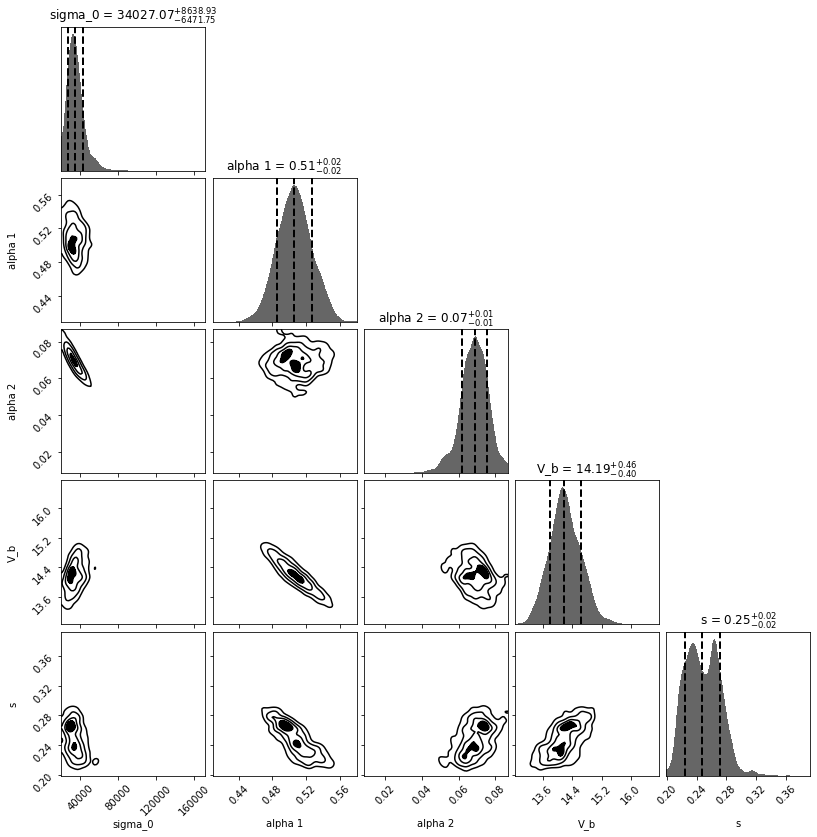

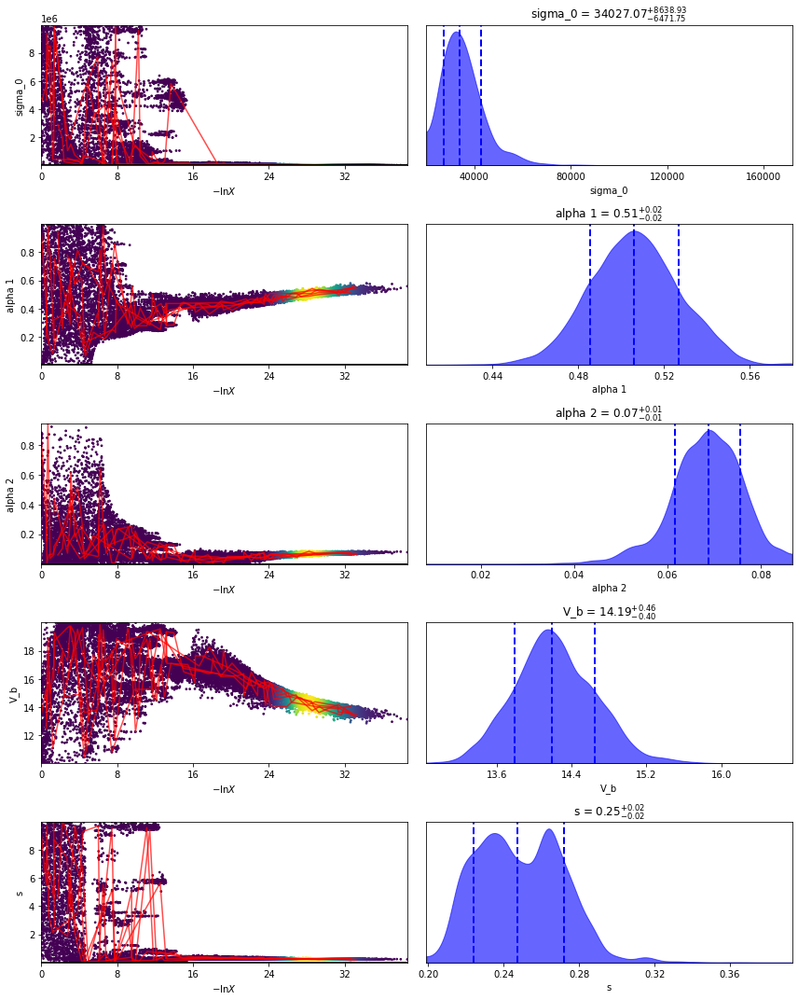

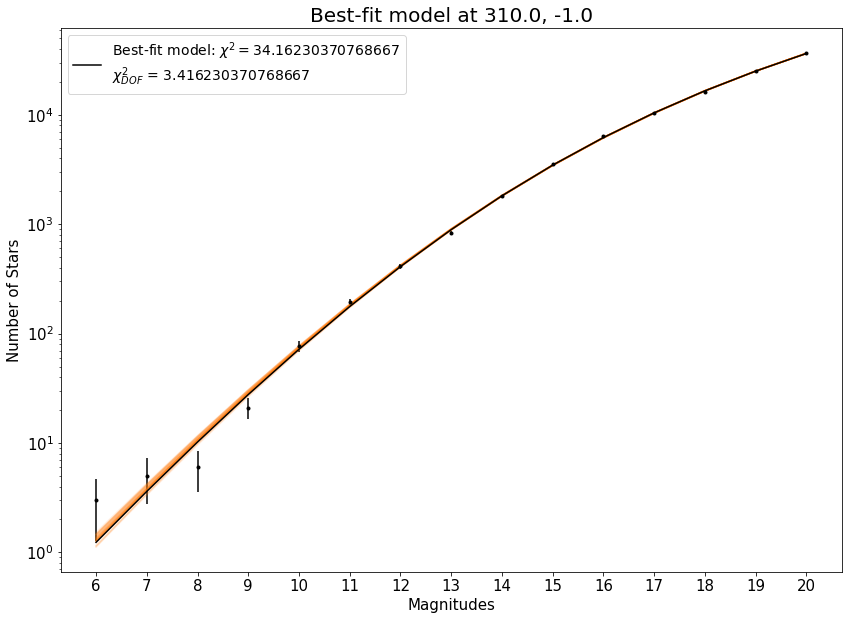

465it [00:00, 4645.82it/s, bound: 0 | nc: 3 | ncall: 1249 | eff(%): 37.230 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/-    nan | dlogz:    inf >  0.509]

330.0 longitude
-1.0 latitude
N3          0.0
N4          0.0
N5          0.0
N6          1.0
N7          5.0
N8          7.0
N9         22.0
N10        73.0
N11       164.0
N12       499.0
N13      1185.0
N14      2783.0
N15      6327.0
N16     12915.0
N17     25832.0
N18     50821.0
N19     90593.0
N20    152163.0
Name: 414, dtype: float64
N3       0.000000
N4       0.000000
N5       0.000000
N6       1.000000
N7       2.236068
N8       2.645751
N9       4.690416
N10      8.544004
N11     12.806248
N12     22.338308
N13     34.423829
N14     52.754147
N15     79.542442
N16    113.644182
N17    160.723365
N18    225.435135
N19    300.986711
N20    390.080761
Name: 414, dtype: float64


12015it [00:19, 620.09it/s, +500 | bound: 148 | nc: 1 | ncall: 274051 | eff(%):  4.575 | loglstar:   -inf < -82.379 <    inf | logz: -105.714 +/-    nan | dlogz:  0.001 >  0.509]  


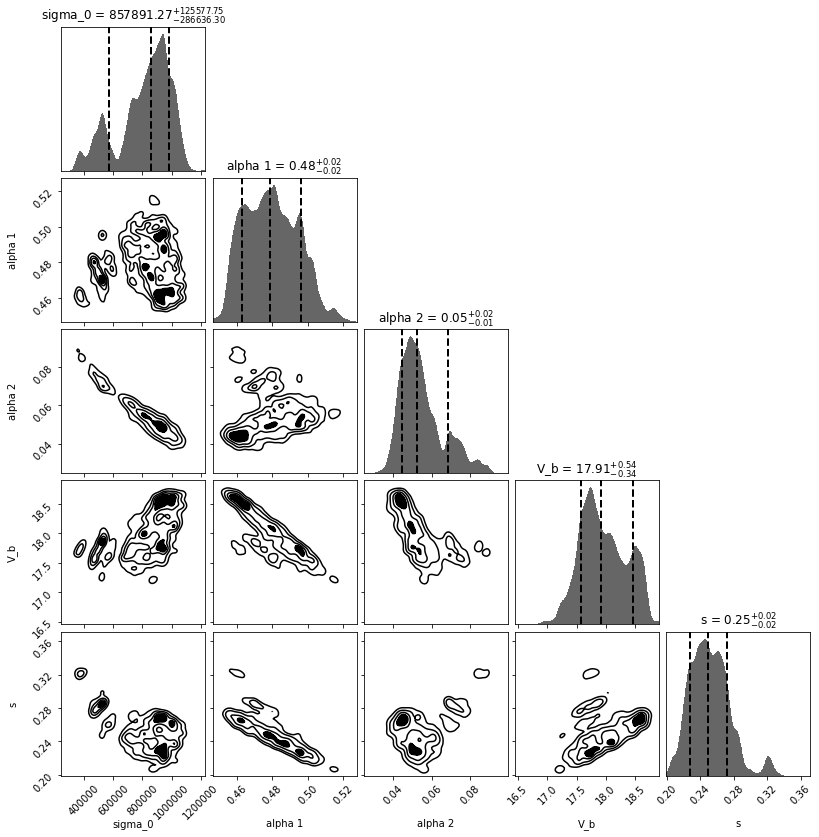

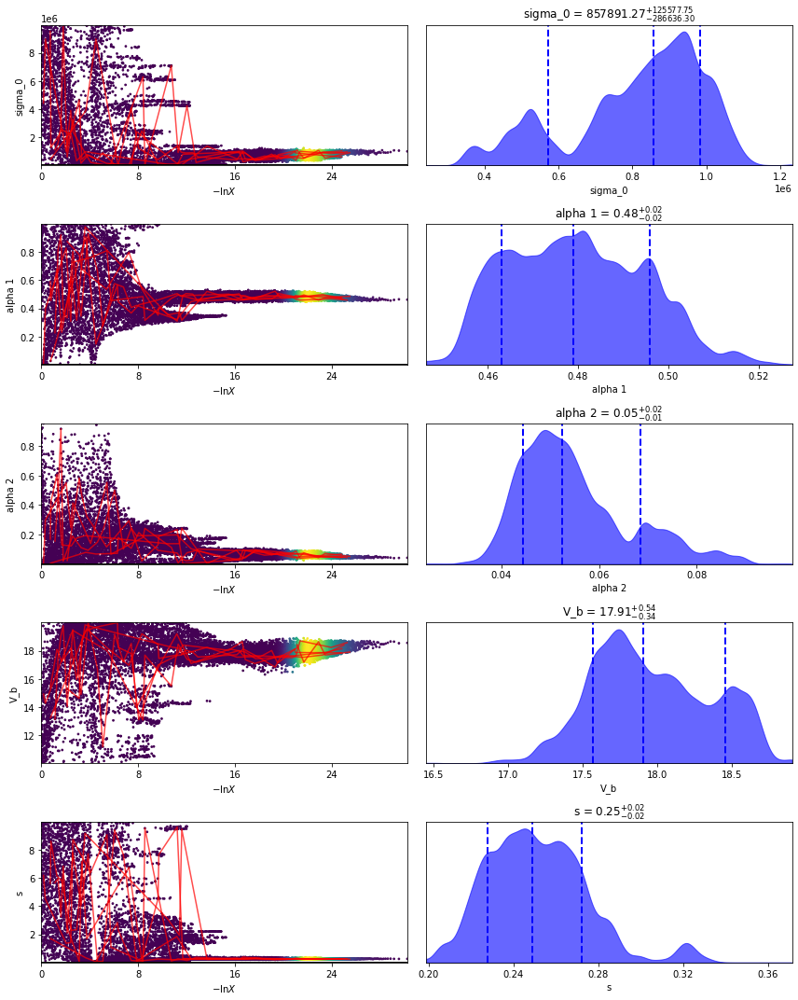

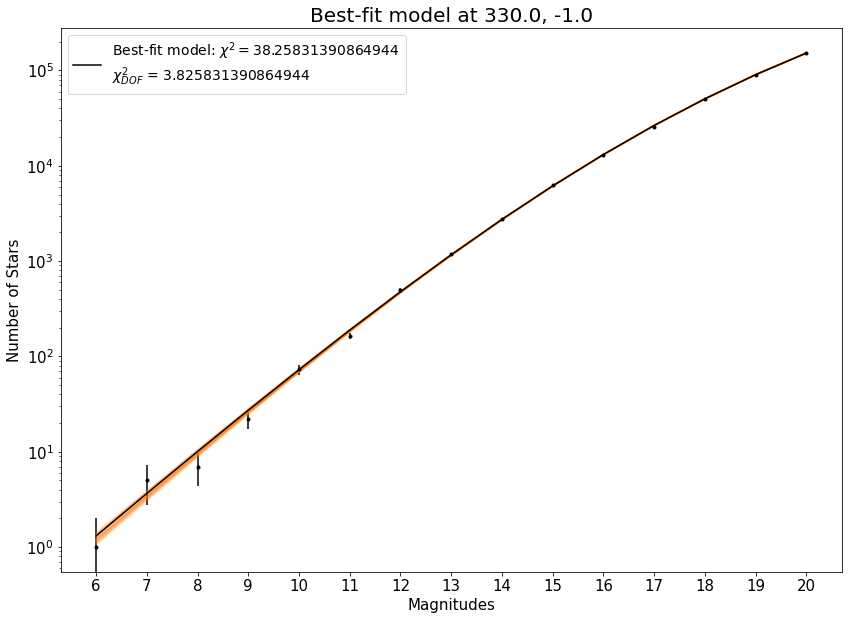

505it [00:00, 5036.56it/s, bound: 0 | nc: 4 | ncall: 1379 | eff(%): 36.621 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/-    nan | dlogz:    inf >  0.509]

340.0 longitude
-1.0 latitude
N3         0.0
N4         1.0
N5         0.0
N6         1.0
N7         3.0
N8        10.0
N9        17.0
N10       62.0
N11      143.0
N12      315.0
N13      694.0
N14     1460.0
N15     2694.0
N16     5007.0
N17     8500.0
N18    14007.0
N19    21519.0
N20    31871.0
Name: 415, dtype: float64
N3       0.000000
N4       1.000000
N5       0.000000
N6       1.000000
N7       1.732051
N8       3.162278
N9       4.123106
N10      7.874008
N11     11.958261
N12     17.748239
N13     26.343880
N14     38.209946
N15     51.903757
N16     70.760158
N17     92.195445
N18    118.351172
N19    146.693558
N20    178.524508
Name: 415, dtype: float64


14112it [00:24, 580.65it/s, +500 | bound: 181 | nc: 1 | ncall: 326733 | eff(%):  4.479 | loglstar:   -inf < -63.240 <    inf | logz: -90.808 +/-    nan | dlogz:  0.001 >  0.509]  


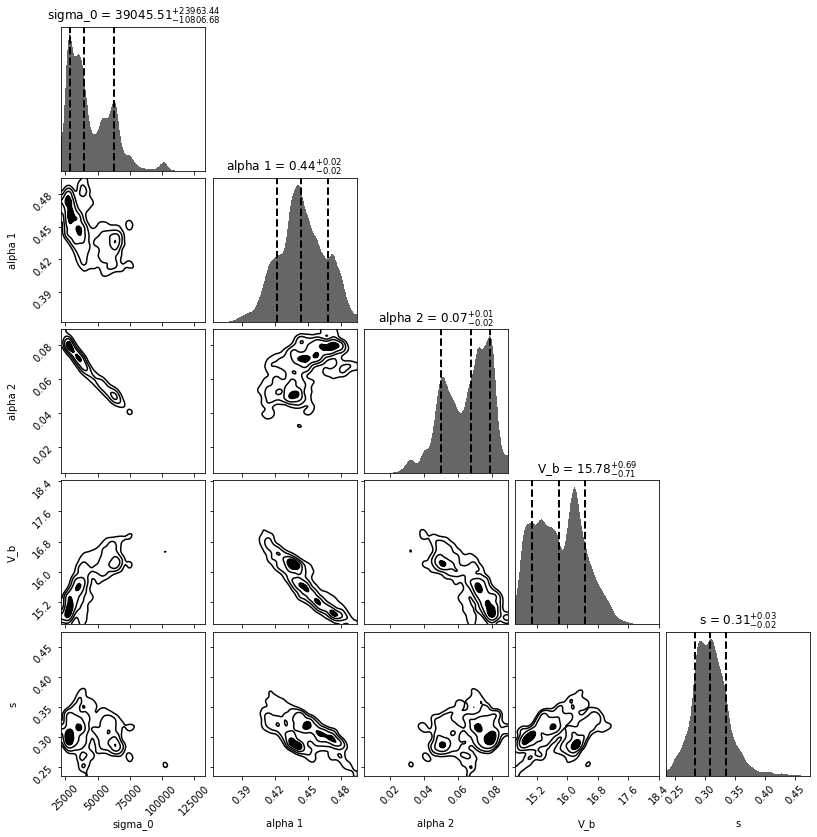

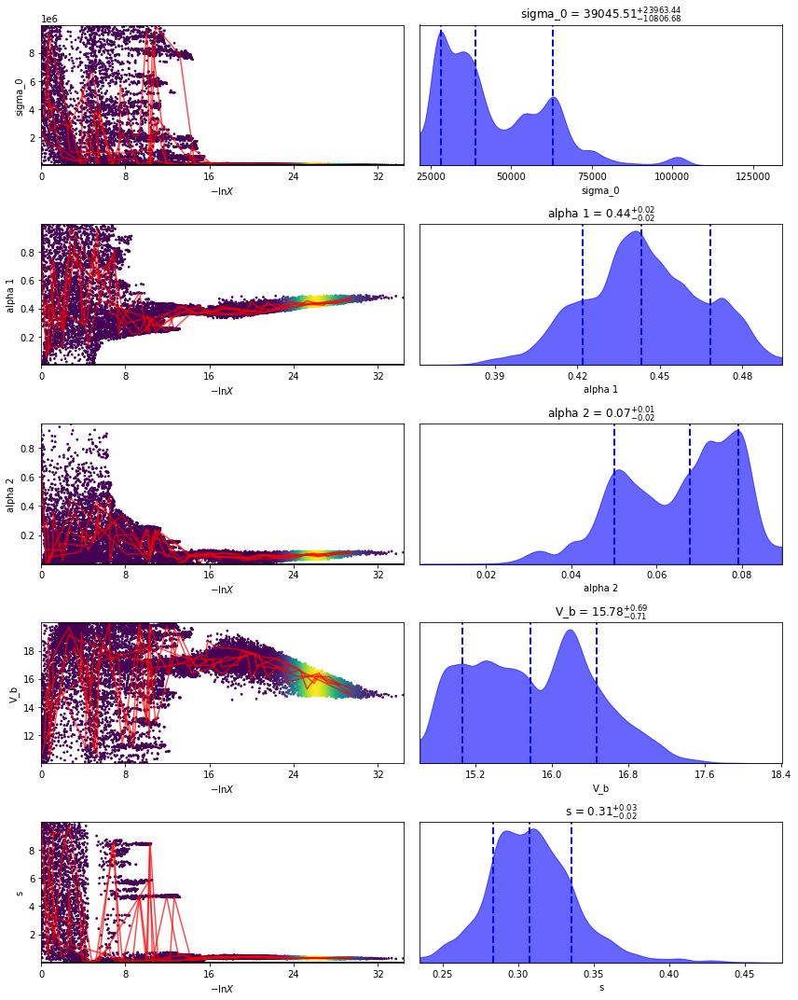

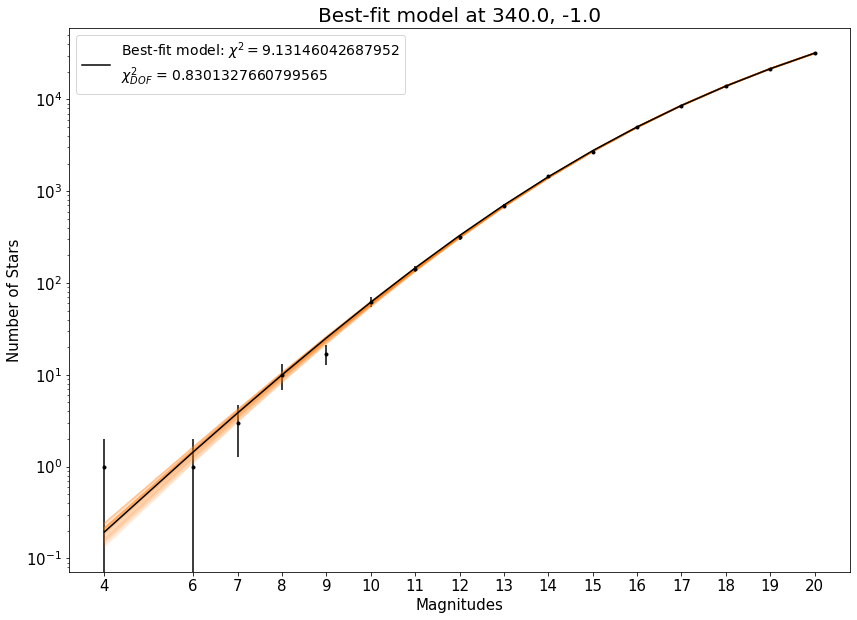

475it [00:00, 4748.95it/s, bound: 0 | nc: 8 | ncall: 1310 | eff(%): 36.260 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/- 217.048 | dlogz:    inf >  0.509]

345.0 longitude
-1.0 latitude
N3         0.0
N4         0.0
N5         0.0
N6         0.0
N7         3.0
N8         7.0
N9        29.0
N10       66.0
N11      215.0
N12      469.0
N13     1031.0
N14     2294.0
N15     4721.0
N16     8736.0
N17    15277.0
N18    25606.0
N19    40444.0
N20    59941.0
Name: 416, dtype: float64
N3       0.000000
N4       0.000000
N5       0.000000
N6       0.000000
N7       1.732051
N8       2.645751
N9       5.385165
N10      8.124038
N11     14.662878
N12     21.656408
N13     32.109189
N14     47.895720
N15     68.709534
N16     93.466572
N17    123.600162
N18    160.018749
N19    201.106937
N20    244.828511
Name: 416, dtype: float64


11240it [00:18, 600.37it/s, +500 | bound: 134 | nc: 1 | ncall: 255344 | eff(%):  4.607 | loglstar:   -inf < -65.985 <    inf | logz: -87.702 +/- 217.004 | dlogz:  0.001 >  0.509]  


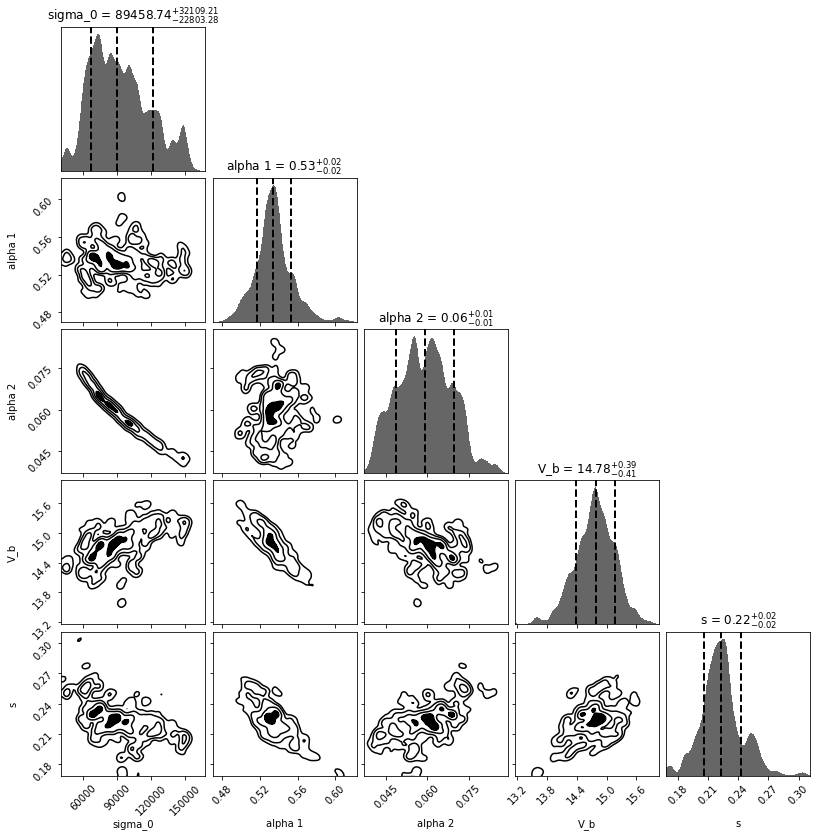

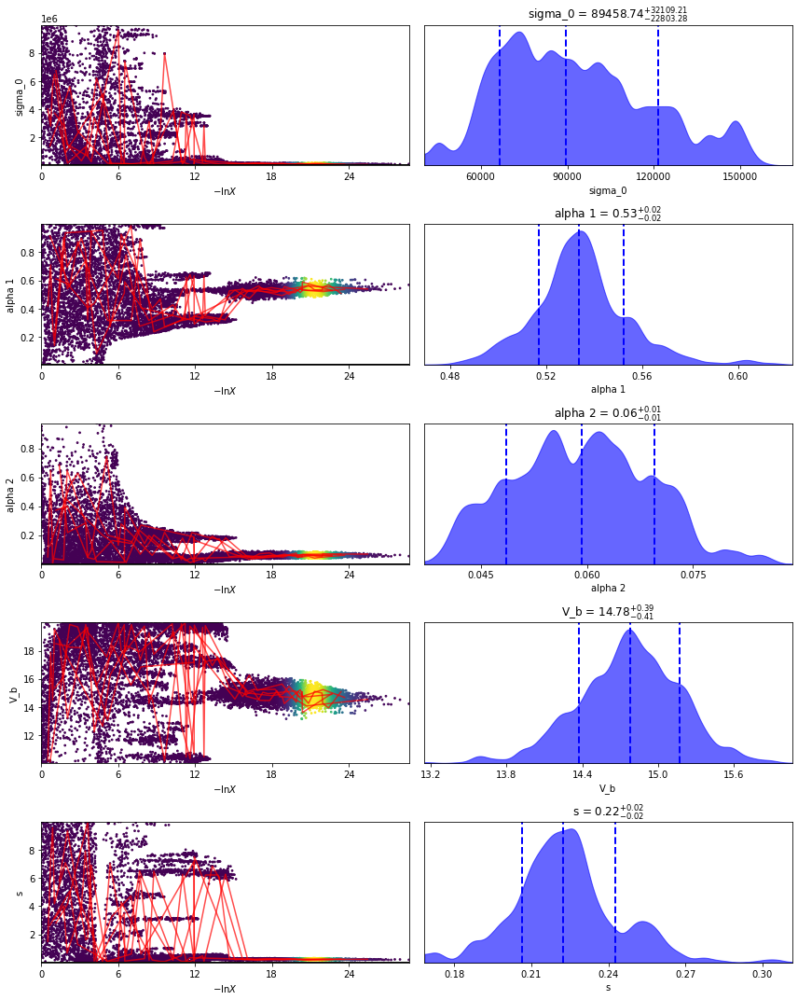

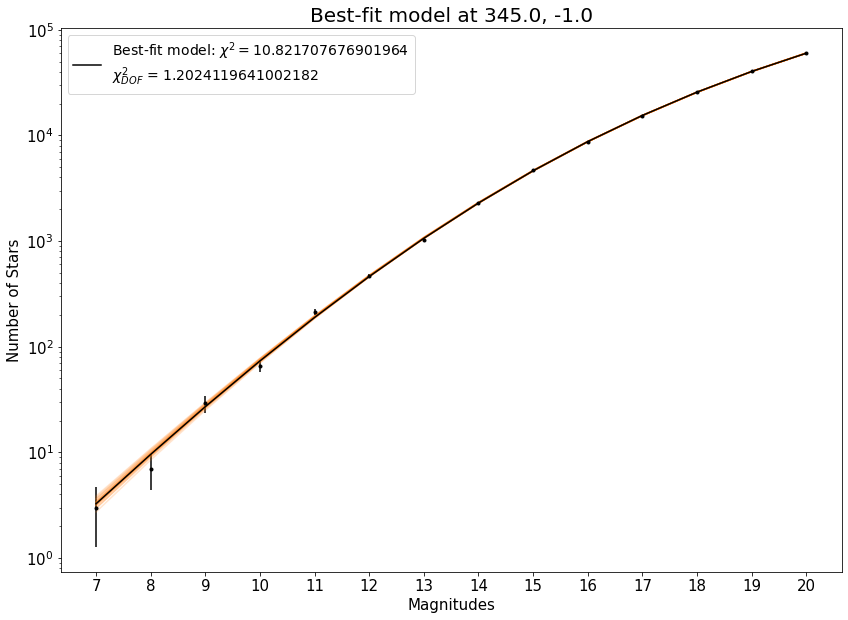

439it [00:00, 4389.91it/s, bound: 0 | nc: 4 | ncall: 1225 | eff(%): 35.837 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/-    nan | dlogz:    inf >  0.509]

350.0 longitude
-1.0 latitude
N3         0.0
N4         0.0
N5         0.0
N6         1.0
N7         3.0
N8         8.0
N9        36.0
N10       83.0
N11      265.0
N12      659.0
N13     1512.0
N14     3146.0
N15     5495.0
N16    10053.0
N17    17221.0
N18    25140.0
N19    33155.0
N20    41804.0
Name: 417, dtype: float64
N3       0.000000
N4       0.000000
N5       0.000000
N6       1.000000
N7       1.732051
N8       2.828427
N9       6.000000
N10      9.110434
N11     16.278821
N12     25.670995
N13     38.884444
N14     56.089215
N15     74.128267
N16    100.264650
N17    131.228808
N18    158.555984
N19    182.085145
N20    204.460265
Name: 417, dtype: float64


17904it [00:30, 586.26it/s, +500 | bound: 224 | nc: 1 | ncall: 421266 | eff(%):  4.374 | loglstar:   -inf < -104.210 <    inf | logz: -139.449 +/-    nan | dlogz:  0.001 >  0.509]


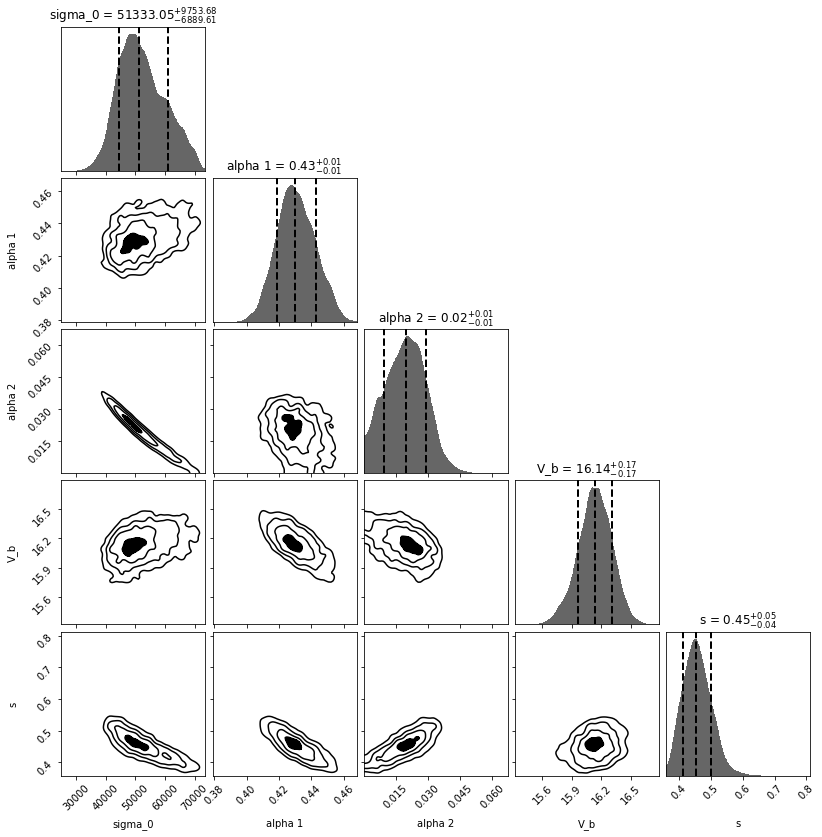

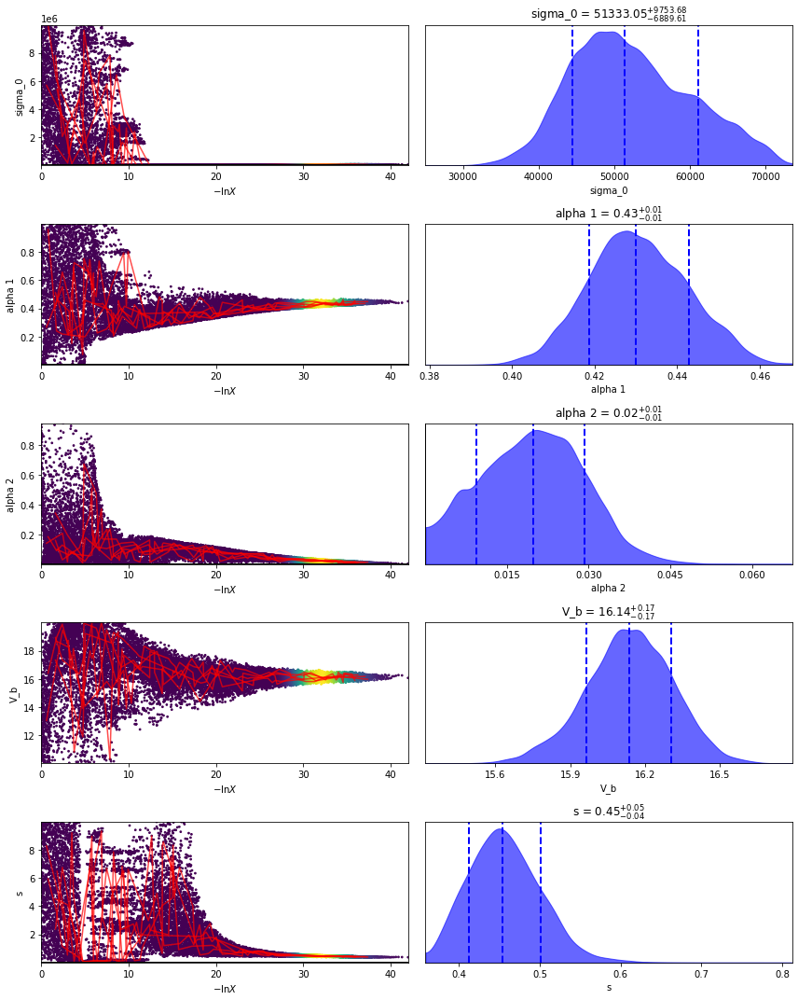

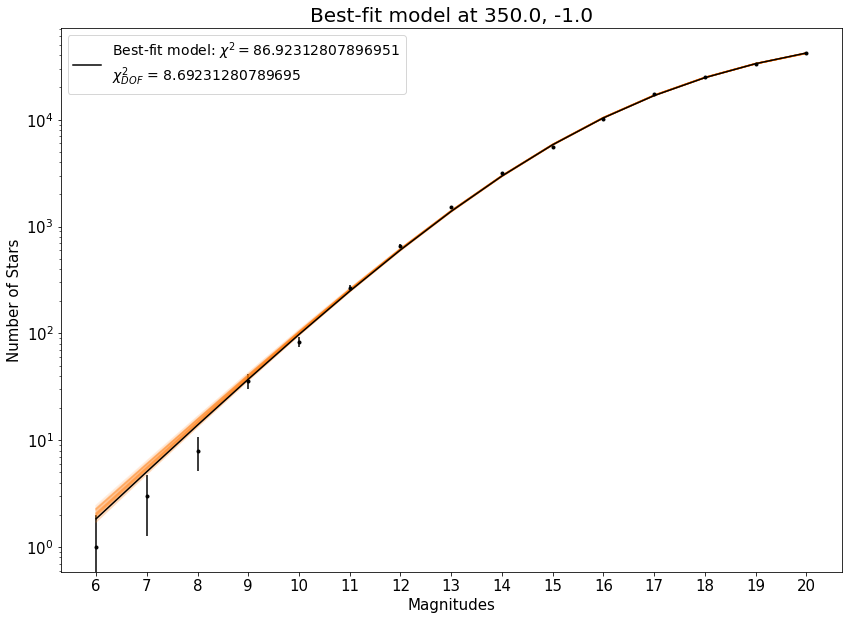

472it [00:00, 4711.99it/s, bound: 0 | nc: 5 | ncall: 1284 | eff(%): 36.760 | loglstar:   -inf <   -inf <    inf | logz:   -inf +/- 184.056 | dlogz:    inf >  0.509]

355.0 longitude
-1.0 latitude
N3          0.0
N4          0.0
N5          0.0
N6          1.0
N7          2.0
N8         10.0
N9         25.0
N10        93.0
N11       211.0
N12       557.0
N13      1156.0
N14      2379.0
N15      5151.0
N16     10468.0
N17     19707.0
N18     36901.0
N19     74944.0
N20    147099.0
Name: 418, dtype: float64
N3       0.000000
N4       0.000000
N5       0.000000
N6       1.000000
N7       1.414214
N8       3.162278
N9       5.000000
N10      9.643651
N11     14.525839
N12     23.600847
N13     34.000000
N14     48.774994
N15     71.770467
N16    102.313244
N17    140.381623
N18    192.096330
N19    273.759018
N20    383.534875
Name: 418, dtype: float64


12782it [00:20, 614.33it/s, +500 | bound: 157 | nc: 1 | ncall: 293398 | eff(%):  4.535 | loglstar:   -inf < -202.366 <    inf | logz: -227.192 +/- 184.083 | dlogz:  0.001 >  0.509] 


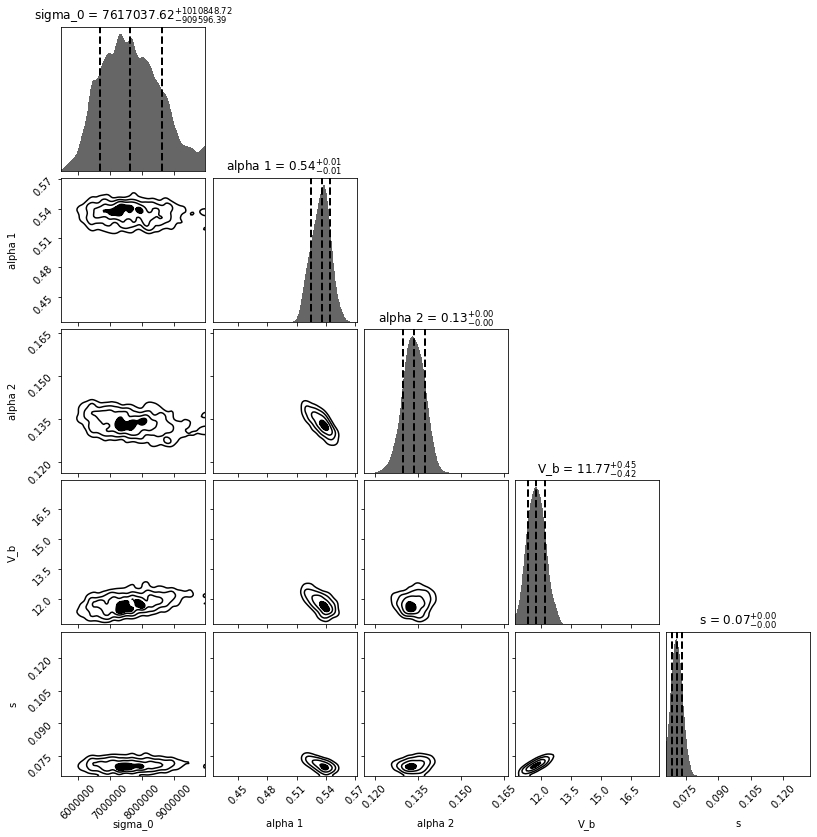

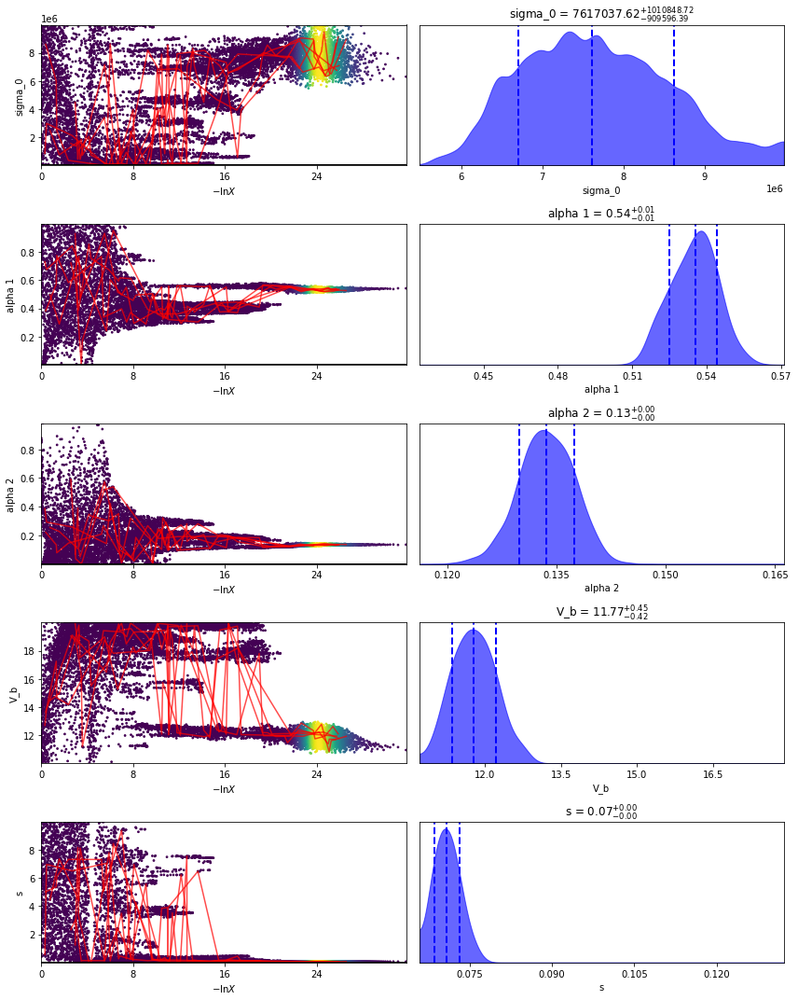

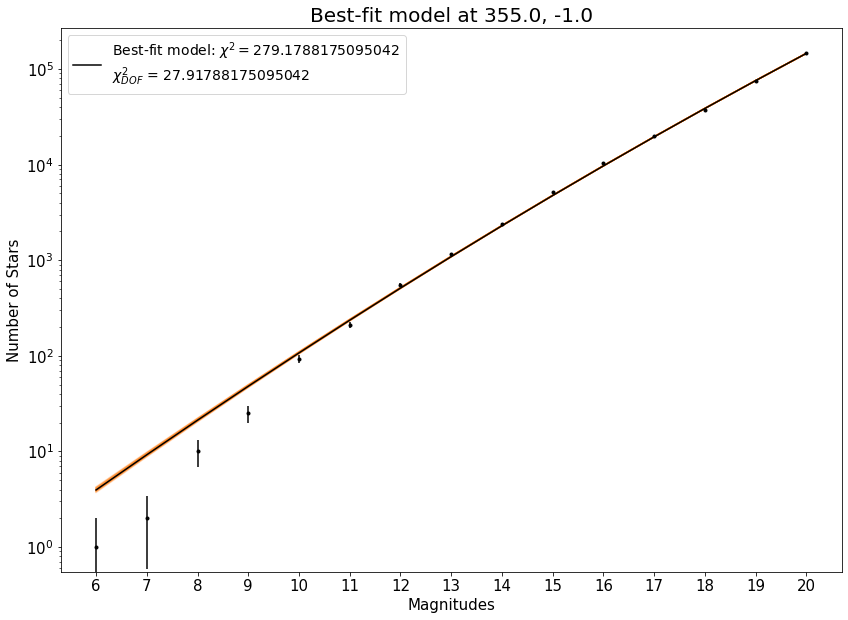

In [14]:
# iterate through a given latitude

selected_df = df.loc[(df['latitude'] == -1)]

# initialize arrays

longitudes = []
latitudes = []
sigma_0 = []
sigma_0_errors = []
alpha_1 = []
alpha_1_errors =[]
alpha_2 = []
alpha_2_errors = []
V_b = []
V_b_errors = []
s = []
s_errors = []


for index, row in selected_df.iterrows():
    
    print(row[0], 'longitude')
    print(row[1], 'latitude')
    
    magnitudes = np.linspace(3, 20, 18)
    y = row[3:]
    yerr = np.sqrt(y)
    
    print(y)
    
    print(yerr)
    
    data = np.array(y)
    
    yerr = np.array(yerr)
    
    # take 0's out of the data
    
    data = data[np.where(y != 0)]
    
    yerr = yerr[np.where(y != 0)]
    
    magnitudes = magnitudes[np.where(y != 0)]

    # Setup Covariance Matrix
    
    C = np.diag((yerr**2))  
    
    Cinv = np.linalg.inv(C)  # define the inverse (i.e. the precision matrix)
    
    lnorm = -0.5 * (np.log(2 * np.pi) * len(data) + np.linalg.slogdet(C)[1])
        
    # run model
        
    ndim = 5
    sampler = NestedSampler(loglike, prior_transform, ndim, sample = 'rwalk')
    sampler.run_nested()
    results = sampler.results
    
    quantiles = [0.16, 0.50, 0.84]
    
    labels = ['sigma_0', 'alpha 1', 'alpha 2', 'V_b', 's']
    
    # save corner, walker plots
    
    fig_corner, caxes = dyplot.cornerplot(results, labels = labels, show_titles=True, quantiles = quantiles, title_quantiles = (0.16, 0.5, 0.84))
        
    fig_walker, axes = dyplot.traceplot(results, truths=np.zeros(ndim), quantiles = quantiles,
                        truth_color='black', show_titles = True, labels = labels,
                        trace_cmap='viridis', connect = True,
                        connect_highlight = range(5), title_quantiles=quantiles)

    fig_walker.tight_layout()
    
        
    # chi-squared
    
    chi_squared_values = []
    
    bestfit_param_values = []
    
    for i in range(ndim):
        
        index = np.argwhere(results.samples[-1001:, i] == statistics.median(results.samples[-1001:, i]))[0][0]
        
        bestfit_param = results.samples[-1001:, :][index]
        
#         print(bestfit_param, 'best fit param')
        
        chi_squared_array = (data - sigma_v(bestfit_param, magnitudes))**2 / (yerr)**2
    
        chi_squared = np.sum(chi_squared_array)
    
#         print(chi_squared, 'chi squared')
    
        chi_squared_values.append(chi_squared)
    
        bestfit_param_values.append(bestfit_param)

    bestfit_param_values = np.array(bestfit_param_values)

    chi_squared = np.min(chi_squared_values)

    index = np.argwhere(chi_squared_values == chi_squared)[0]

    bestfit_param = bestfit_param_values[index, :][0]
    
    n_datapoints = len(data)

    n_parameters = 5

    chi_squared_DOF = chi_squared / (n_datapoints - n_parameters)
    

    inds = np.random.randint(low = len(results.samples) - 1000, high = len(results.samples), size=50)

    fig_model, ax = plt.subplots(figsize=(14,10))
    for ind in inds:
        sample = results.samples[ind]
        model_trial = sigma_v(sample, magnitudes)
        plt.plot(magnitudes, model_trial, "C1", alpha=0.1)
    plt.errorbar(magnitudes, data, yerr = np.array(yerr), fmt=".k", capsize=0)
    plt.plot(magnitudes, sigma_v(bestfit_param, magnitudes), "k", label="Best-fit model: $\chi^2 = " + str(chi_squared) + "$\n"
        + "$\chi^2_{DOF}$ = " + str(chi_squared_DOF))
    plt.legend(fontsize=14)
    plt.xticks(magnitudes)
    plt.title('Best-fit model at ' + str(row[0]) + ', ' + str(row[1]), fontsize = 20)
    plt.yscale('log')
    plt.xlabel("Magnitudes", fontsize = 15)
    plt.ylabel("Number of Stars", fontsize = 15)
    plt.xticks(fontsize = 15)
    plt.yticks(fontsize = 15)
    plt.show();

    # save graphs
    
    figs = [fig_walker, fig_corner, fig_model] # list of figures
    with PdfPages(str(row[0]) + ', ' + str(row[1]) + ' figures.pdf') as pdf:
        for fig in figs:
            pdf.savefig(fig, bbox_inches='tight')
            
    # append values to their arrays
    samples = results.samples
    weights = results.importance_weights()
    quantiles_final = [dyfunc.quantile(samps, [0.16, 0.5, 0.84], weights = weights)
             for samps in samples.T]

    longitudes.append(row[0])
    latitudes.append(row[1])
    sigma_0.append(bestfit_param[0])
    sigma_0_errors.append((quantiles_final[0][1] - quantiles_final[0][0],
          quantiles_final[0][2] - quantiles_final[0][1]))
    alpha_1.append(bestfit_param[1])
    alpha_1_errors.append((quantiles_final[1][1] - quantiles_final[1][0],
          quantiles_final[1][2] - quantiles_final[1][1]))
    alpha_2.append(bestfit_param[2])
    alpha_2_errors.append((quantiles_final[2][1] - quantiles_final[2][0],
          quantiles_final[2][2] - quantiles_final[2][1]))
    V_b.append(bestfit_param[3])
    V_b_errors.append((quantiles_final[3][1] - quantiles_final[3][0],
          quantiles_final[3][2] - quantiles_final[3][1]))
    s.append(bestfit_param[4])
    s_errors.append((quantiles_final[4][1] - quantiles_final[4][0],
          quantiles_final[4][2] - quantiles_final[4][1]))
    
    

In [15]:
new_df = pd.DataFrame()

new_df['longitude'] = pd.Series(longitudes)
new_df['latitude'] = pd.Series(latitudes)
new_df['sigma_0'] = pd.Series(sigma_0)
new_df['sigma_0 errors'] = pd.Series(sigma_0_errors)
new_df['alpha_1'] = pd.Series(alpha_1)
new_df['alpha_1 errors'] = pd.Series(alpha_1_errors)
new_df['alpha_2'] = pd.Series(alpha_2)
new_df['alpha_2 errors'] = pd.Series(alpha_2_errors)
new_df['V_b'] = pd.Series(V_b)
new_df['V_b errors'] = pd.Series(V_b_errors)
new_df['s'] = pd.Series(s)
new_df['s errors'] = pd.Series(s_errors)


new_df

,longitude,latitude,sigma_0,sigma_0 errors,alpha_1,alpha_1 errors,alpha_2,alpha_2 errors,V_b,V_b errors,s,s errors
0,0.0,-1.0,9.810432e+06,"(3132.8595259021968, 3196.4790004435927)",0.509170,"(0.00019465926710560133, 0.0001939939058239748)",0.000018,"(2.2911923194038568e-05, 5.132015911821222e-05)",19.257105,"(0.00047664850091777566, 0.0004706833845702363)",9.999335,"(0.002863130875143227, 0.001450710644524733)"
1,5.0,-1.0,3.797860e+03,"(434.8903059052345, 429.00755507289705)",0.425549,"(0.010823844143003858, 0.013670419223493158)",0.216634,"(0.0031369423790411632, 0.0027433546508389695)",14.038645,"(0.2385791104275654, 0.19476747910271364)",1.541978,"(0.3251668781205379, 0.3543677786797763)"
2,10.0,-1.0,4.934818e+04,"(12430.046044181552, 15641.381815008288)",0.449932,"(0.009994989244436647, 0.01730473464507698)",0.103332,"(0.014860432218165534, 0.014149604456873757)",15.800271,"(0.1366620792713089, 0.18785144257719466)",0.364575,"(0.08008035315733963, 0.0842397188099171)"
3,15.0,-1.0,3.026177e+04,"(11326.395250478614, 13763.510434621385)",0.702385,"(0.01803759053638654, 0.012920046639084415)",0.062377,"(0.005544555976841926, 0.006077193902746879)",10.055673,"(0.12902389531946845, 0.3046128079763868)",0.124706,"(0.005146754526341085, 0.005536550527501155)"
4,20.0,-1.0,7.540523e+03,"(658.4513621240676, 797.8801974162998)",0.397155,"(0.016716332499163655, 0.020613472781282116)",0.116935,"(0.006587010770854496, 0.005847663834564573)",14.863024,"(0.30135887863866984, 0.2642500740721818)",0.827958,"(0.14270592891546896, 0.1499759747419691)"
5,30.0,-1.0,8.599634e+04,"(36535.20290256193, 68138.23378132333)",0.409221,"(0.01717639452360248, 0.025030635947304813)",0.033620,"(0.013971210611118293, 0.014092958202652172)",17.252483,"(0.9606692671479244, 0.8104882104828306)",0.228141,"(0.03146959391994669, 0.026856190828328158)"
6,50.0,-1.0,6.668134e+03,"(1385.502717031678, 1445.7635756692252)",0.396688,"(0.012695703653577084, 0.014332295008838092)",0.153117,"(0.006957154549129152, 0.01081008764889771)",14.995276,"(0.273949384073914, 0.2845895490631687)",0.773122,"(0.12469690182533144, 0.22832615914161747)"
7,70.0,-1.0,7.210073e+03,"(1180.5452506046295, 1235.116634904537)",0.415110,"(0.01650835631336639, 0.015810237110634007)",0.092194,"(0.008907477546716294, 0.00996410332966767)",14.926623,"(0.3338666163984385, 0.29591101604131254)",0.565034,"(0.09515583160142238, 0.1550465528647259)"
8,90.0,-1.0,3.350671e+04,"(7056.046190362555, 8045.026573056963)",0.383264,"(0.01117014507844788, 0.013378509938305083)",0.069100,"(0.013912196952369095, 0.01606430391965466)",17.015941,"(0.34704562385103443, 0.3162367089382947)",0.542482,"(0.08206222173254374, 0.09971393489029257)"
9,120.0,-1.0,3.912986e+04,"(2111.41695214848, 1742.490458425622)",0.417063,"(0.01088428654940704, 0.011960152502775212)",0.003127,"(0.001792046066191611, 0.003964288767741528)",16.929088,"(0.1374907311981559, 0.13526889469825676)",0.555802,"(0.03980432485763907, 0.0429840315367882)"


0       0.0
1       5.0
2      10.0
3      15.0
4      20.0
5      30.0
6      50.0
7      70.0
8      90.0
9     120.0
10    150.0
11    180.0
12    210.0
13    240.0
14    270.0
15    290.0
16    310.0
17    330.0
18    340.0
19    345.0
20    350.0
21    355.0
Name: longitude, dtype: float64


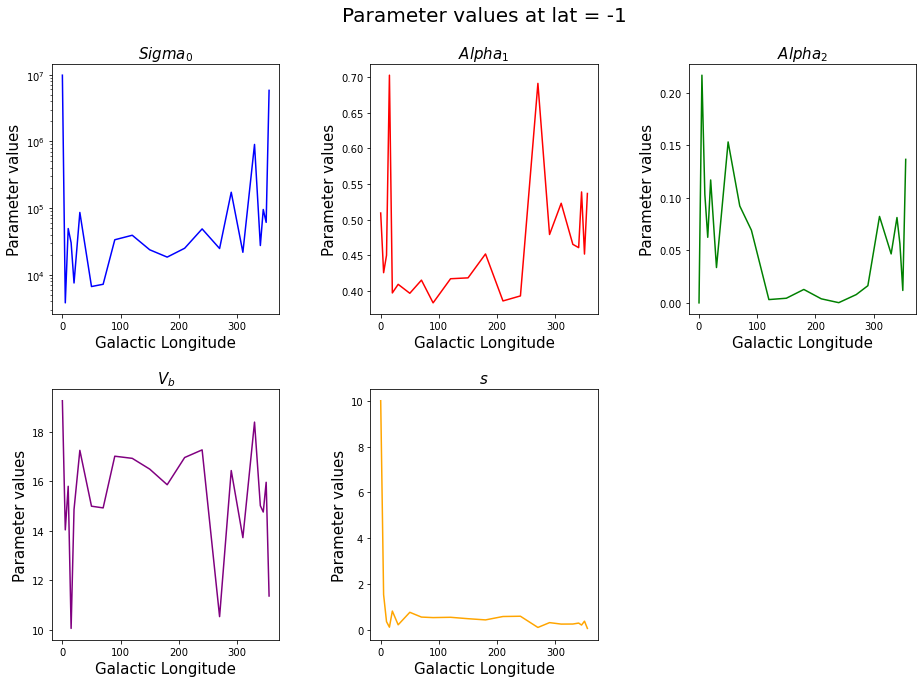

In [16]:
ind_sorted = np.argsort(new_df.longitude)
longitudes, sigma_0_arr = new_df.longitude[ind_sorted], new_df.sigma_0[ind_sorted]
alpha_1_arr = new_df.alpha_1[ind_sorted]
alpha_2_arr = new_df.alpha_2[ind_sorted]
V_b_arr = new_df.V_b[ind_sorted]
s_arr = new_df.s[ind_sorted]

print(longitudes)

fig = plt.figure(figsize=(15, 10))
spec = mpl.gridspec.GridSpec(ncols=3, nrows=2)

fig.suptitle('Parameter values at lat = -1', fontsize = 20)

ax1 = fig.add_subplot(spec[0,0])
ax1.plot(longitudes, sigma_0_arr, color = 'blue')
ax1.set_title('$Sigma_0$', fontsize = 15)
ax1.set_xlabel('Galactic Longitude', fontsize = 15)
ax1.set_ylabel('Parameter values', fontsize = 15)
ax1.set_yscale('log')
ax2 = fig.add_subplot(spec[0,1])
ax2.plot(longitudes, alpha_1_arr, color = 'red')
ax2.set_title('$Alpha_1$', fontsize = 15)
ax2.set_xlabel('Galactic Longitude', fontsize = 15)
ax2.set_ylabel('Parameter values', fontsize = 15)
ax3 = fig.add_subplot(spec[0,2])
ax3.plot(longitudes, alpha_2_arr, color = 'green')
ax3.set_title('$Alpha_2$', fontsize = 15)
ax3.set_ylabel('Parameter values', fontsize = 15)
ax3.set_xlabel('Galactic Longitude', fontsize = 15)
ax4 = fig.add_subplot(spec[1,0])
ax4.plot(longitudes, V_b_arr, color = 'purple')
ax4.set_title('$V_b$', fontsize = 15)
ax4.set_ylabel('Parameter values', fontsize = 15)
ax4.set_xlabel('Galactic Longitude', fontsize = 15)
ax5 = fig.add_subplot(spec[1,1])
ax5.plot(longitudes, s_arr, color = 'orange')
ax5.set_title('$s$', fontsize = 15)
ax5.set_ylabel('Parameter values', fontsize = 15)
ax5.set_xlabel('Galactic Longitude', fontsize = 15)

plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4,
                    hspace=0.3)

In [17]:
new_df.to_csv('lat_neg_one_model')